## LDA – линейный дискриминантный анализ.

In [1]:
# %pip install -r requirements.txt 

In [ ]:
import time

import pandas as pd
import numpy as np
from sklearn.datasets import make_blobs
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve, average_precision_score

### [1] Используя функцию make_blobs с любым random_state, сгенерировать датасет df1, в котором есть три класса с размером каждого класса 1000 объектов и 16 количественных (недискретных) признаков.

In [3]:
n_features = 16

centers = np.array([
    np.repeat(0.0, n_features),
    np.repeat(1.0, n_features),
    np.repeat(5.0, n_features)
])

X, Y = make_blobs(n_samples=3000, n_features=n_features, random_state=42, centers=centers) 

df = pd.DataFrame(X, columns=[f"x{i+1}" for i in range(n_features)])
df['target'] = Y
df['id'] = df.index

feature_columns = [col for col in df.columns if col not in ['target', 'id']]

Не забываем повторять шаги задания 1:
- ключевые характеристики датасета
- корреляции
- визуализация на всех парах переменных

In [4]:
def dataset_overview(df: pd.DataFrame) -> None:
    print(f"Размер датасета: {df.shape}")
    print(f"Количество признаков: {len(feature_columns)}")
    print(f"Количество классов: {df['target'].nunique()}")
    print("\nКоличество объектов по классам:")
    print(df['target'].value_counts())
    percent_missing = (df.isnull().sum() / len(df) * 100).round(2)
    print("\nПроцент пропусков по признакам:")
    print(percent_missing)
    display (df.describe())

In [5]:
dataset_overview(df)

Размер датасета: (3000, 18)
Количество признаков: 16
Количество классов: 3

Количество объектов по классам:
target
0    1000
1    1000
2    1000
Name: count, dtype: int64

Процент пропусков по признакам:
x1        0.0
x2        0.0
x3        0.0
x4        0.0
x5        0.0
x6        0.0
x7        0.0
x8        0.0
x9        0.0
x10       0.0
x11       0.0
x12       0.0
x13       0.0
x14       0.0
x15       0.0
x16       0.0
target    0.0
id        0.0
dtype: float64


,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,target,id
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,1.974357,1.979541,1.987663,1.982409,2.031480,2.023118,2.012013,1.976625,2.011322,1.986331,1.986404,2.029216,2.003071,1.971005,2.013250,2.009984,1.000000,1499.500000
std,2.377888,2.385622,2.399607,2.352606,2.351964,2.371302,2.402491,2.387317,2.384787,2.346357,2.380665,2.381351,2.366355,2.390340,2.417010,2.363902,0.816633,866.169729
min,-2.973306,-2.993707,-3.321115,-3.033989,-3.241514,-3.329504,-3.307900,-2.921350,-3.836656,-3.044657,-3.922400,-3.688365,-3.375579,-3.601085,-3.250333,-3.232565,0.000000,0.000000
25%,0.098444,0.095993,0.097382,0.150355,0.232065,0.169160,0.117678,0.082602,0.143977,0.168567,0.084496,0.158716,0.169193,0.091005,0.119462,0.176283,0.000000,749.750000
50%,1.269792,1.235682,1.251105,1.179549,1.316262,1.281936,1.235824,1.230963,1.276961,1.248227,1.267987,1.314951,1.281986,1.193339,1.237425,1.271705,1.000000,1499.500000
75%,4.340937,4.314537,4.372775,4.188846,4.300771,4.305552,4.437625,4.259931,4.332904,4.271307,4.271465,4.343349,4.278738,4.330092,4.381113,4.313220,2.000000,2249.250000
max,8.019653,7.933403,7.955533,8.002652,8.602415,8.335268,8.536532,8.139114,8.727833,7.923554,7.951197,7.935967,7.927369,7.761056,8.380614,8.222928,2.000000,2999.000000


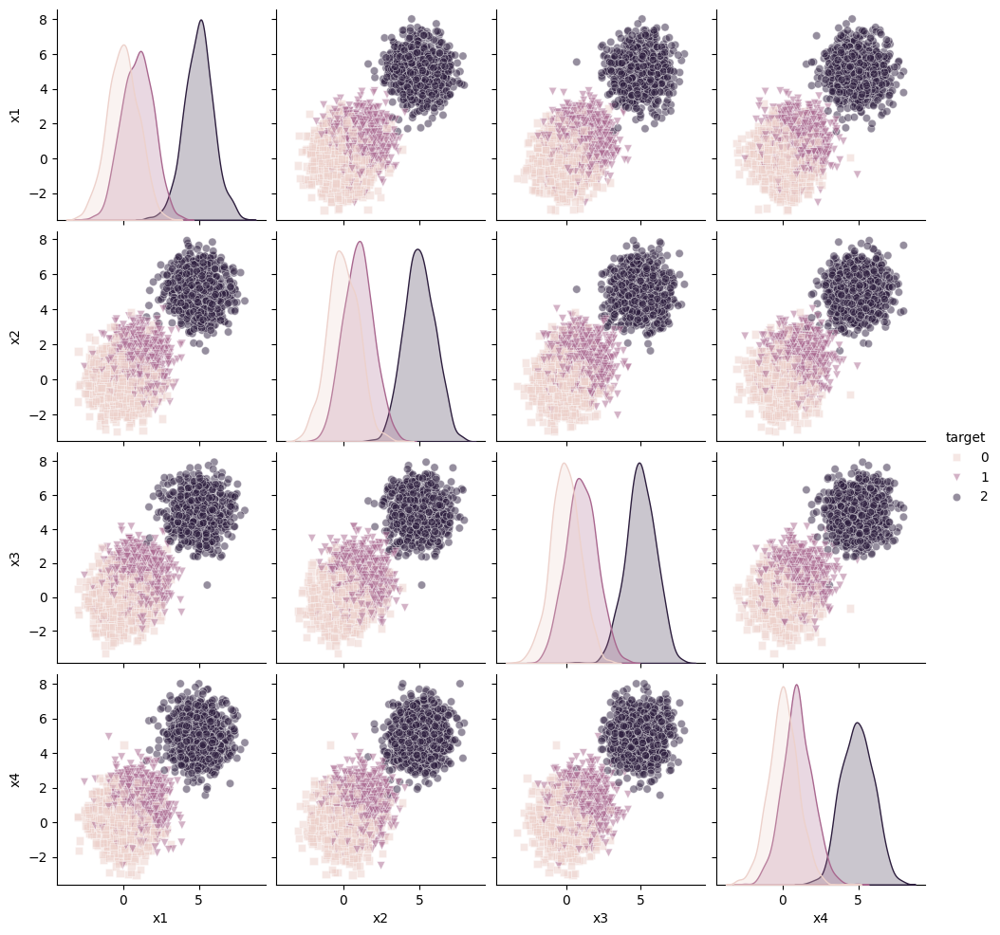

In [6]:
features_no_display = [f'x{i}' for i in range (5,17)] + ['id']
sns.pairplot(df.drop(columns=features_no_display), hue='target', markers=['s', 'v', 'o'],  plot_kws={'alpha': 0.5} )
plt.show()

In [7]:
correlation_matrix = df.drop(columns=['id']).corr()
display(correlation_matrix)

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,target
x1,1.000000,0.822992,0.829271,0.815442,0.818717,0.826754,0.826099,0.819645,0.824866,0.822170,0.820942,0.819276,0.818283,0.827407,0.827376,0.819472,0.855015
x2,0.822992,1.000000,0.826007,0.827596,0.820913,0.823634,0.827893,0.820962,0.829636,0.823471,0.815601,0.821609,0.819854,0.824682,0.826987,0.825757,0.858694
x3,0.829271,0.826007,1.000000,0.823030,0.819209,0.828787,0.826072,0.818418,0.821721,0.822627,0.818135,0.829771,0.823884,0.829600,0.822459,0.824295,0.861207
x4,0.815442,0.827596,0.823030,1.000000,0.814144,0.823257,0.818476,0.824870,0.828390,0.825773,0.818595,0.820204,0.823742,0.821634,0.821078,0.824822,0.852003
x5,0.818717,0.820913,0.819209,0.814144,1.000000,0.821596,0.817620,0.820792,0.821740,0.826419,0.818703,0.816265,0.816782,0.819014,0.826275,0.817959,0.855313
x6,0.826754,0.823634,0.828787,0.823257,0.821596,1.000000,0.828366,0.826604,0.825734,0.824625,0.818830,0.823975,0.825443,0.825062,0.822857,0.824392,0.854856
x7,0.826099,0.827893,0.826072,0.818476,0.817620,0.828366,1.000000,0.824442,0.823766,0.828476,0.822383,0.835691,0.830507,0.825960,0.829631,0.827593,0.859339
x8,0.819645,0.820962,0.818418,0.824870,0.820792,0.826604,0.824442,1.000000,0.820142,0.818945,0.821959,0.826264,0.823747,0.827112,0.825970,0.822988,0.854861
x9,0.824866,0.829636,0.821721,0.828390,0.821740,0.825734,0.823766,0.820142,1.000000,0.821542,0.823627,0.821870,0.818599,0.829632,0.824920,0.822401,0.858298
x10,0.822170,0.823471,0.822627,0.825773,0.826419,0.824625,0.828476,0.818945,0.821542,1.000000,0.817080,0.823694,0.820482,0.826424,0.823382,0.822243,0.859546


### [2] На основе созданного в пункте [1] датасета df1 сгенерировать отдельные дополнительные датасеты (df2, df5, df10...), в которых объекты одного класса (который имеет пересечение с другим) повторены 2 раза, 5 раз, 10 раз, 20 раз, 50 раз, 100 раз, 1000 раз, 10k раз, а количество объектов в остальных классах осталось неизменно.

In [8]:
def repeat_class(n, target):
    target_df = df[df['target'] == target]
    repeated_target_df = pd.concat([target_df] * n, ignore_index=True)
    non_target_df = df[df['target'] != target]
    return pd.concat([non_target_df, repeated_target_df], ignore_index=True)

df_multipliers = [1, 2, 5, 10, 20, 50, 100, 1000, 10000]

class_pair = (0,1)
feat_pair = ('x1','x2')

fit_times = {}

target_to_repeat = class_pair[0]

repeat_df_dict = {}
repeat_df_dict = {m: repeat_class(m, target=target_to_repeat) for m in df_multipliers}
    
repeat_df_dict[5]['target'].value_counts()

target
0    5000
1    1000
2    1000
Name: count, dtype: int64

### [3] Выбрать пару классов (включая класс с повторенными объектами) и пару количественных признаков. Используя метод LDA, для каждого из сформированных датасетов df1, df2, df5, df10, df20, df50, df100, df1000, df10k графически построить решающую функцию алгоритма, разграниченные решающей функцией зоны и отдельные объекты классов; отдельно численно вывести время построения каждого решения.
Визуализацию данного пункта лучше реализовать в паре с пунктом [5].

**Выбор:** первые два класса (они пересекаются, будет, вероятно, несколько нагляднее) и первые два признака

C:\Users\bukli\AppData\Local\Temp\ipykernel_5724\4115294728.py:41: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\bukli\projects\SDT-in-practice\lab2\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


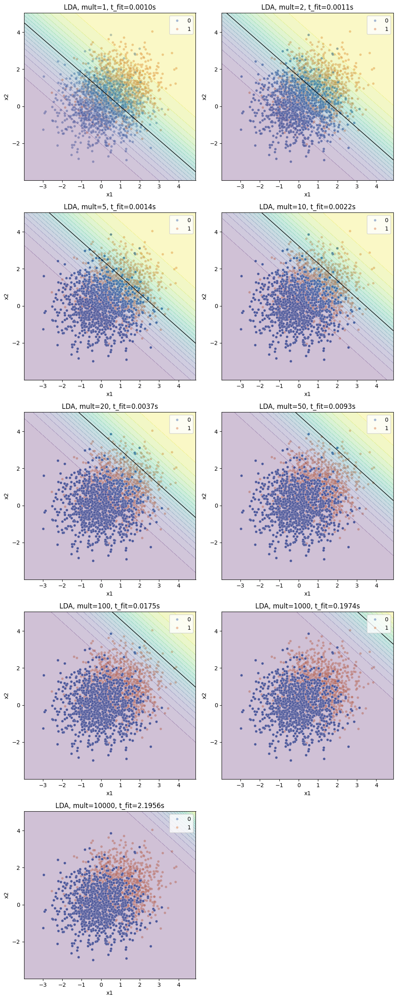

Время обучения LDA по коэффициентам увеличения:
mult=1: 0.001037 s
mult=2: 0.001051 s
mult=5: 0.001419 s
mult=10: 0.002188 s
mult=20: 0.003651 s
mult=50: 0.009260 s
mult=100: 0.017549 s
mult=1000: 0.197438 s
mult=10000: 2.195647 s


In [ ]:
multipliers = list(df_multipliers)
n = len(multipliers)
cols = 2
rows = int(np.ceil(n / cols))

fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
axes = axes.flatten()

for idx, m in enumerate(multipliers):
    dfm = repeat_df_dict[m]

    df_sub = dfm[dfm['target'].isin(class_pair)].copy()
    X = df_sub[list(feat_pair)].values
    y = (df_sub['target'] == class_pair[1]).astype(int).values

    t0 = time.time()
    lda = LinearDiscriminantAnalysis()
    lda.fit(X, y)
    t_fit = time.time() - t0
    fit_times[m] = t_fit

    xx_min, xx_max = X[:,0].min()-1, X[:,0].max()+1
    yy_min, yy_max = X[:,1].min()-1, X[:,1].max()+1
    xx, yy = np.meshgrid(np.linspace(xx_min, xx_max, 300),
                         np.linspace(yy_min, yy_max, 300))
    grid = np.c_[xx.ravel(), yy.ravel()]
    prob_grid = lda.predict_proba(grid)[:,1].reshape(xx.shape)

    ax = axes[idx]
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y,
                    palette='deep', alpha=0.5, s=20, ax=ax)
    ax.contourf(xx, yy, prob_grid, levels=20, alpha=0.25)
    ax.contour(xx, yy, prob_grid, levels=[0.5], colors='k', linewidths=1)
    ax.set_xlabel(feat_pair[0])
    ax.set_ylabel(feat_pair[1])
    ax.set_title(f"LDA, mult={m}, t_fit={t_fit:.4f}s")

for j in range(idx+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

print("Время обучения LDA по коэффициентам увеличения:")
for m,t in fit_times.items():
    print(f"mult={m}: {t:.6f} s")

### [4] Для датасетов df1, df2, df5, df10, df20, df50, df100, df1000 из пункта [3] восстановить таблицу координаты следующих точек:
- центры масс каждого класса; - общий центр масс выбранных классов;
- центр отрезка, соединяющего центры масс выбранных классов.
Для датасетов отдельно на графиках с решающей функцией LDA вывести положения
центров масс и соединяющий центры масс классов отрезок с его центральной точкой.

In [10]:
target_positive = target_to_repeat

mult=1 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,0.473040,0.474682
3,midpoint,0.473040,0.474682


mult=2 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,0.314590,0.307210
3,midpoint,0.473040,0.474682


mult=5 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,0.156140,0.139739
3,midpoint,0.473040,0.474682


mult=10 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,0.084118,0.063615
3,midpoint,0.473040,0.474682


mult=20 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,0.042962,0.020116
3,midpoint,0.473040,0.474682


mult=50 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,0.016332,-0.008030
3,midpoint,0.473040,0.474682


mult=100 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,0.007103,-0.017784
3,midpoint,0.473040,0.474682


mult=1000 — centers (features ('x1', 'x2')):


,point,x,y
0,class_0_center,-0.002310,-0.027733
1,class_1_center,0.948389,0.977096
2,overall_center,-0.001360,-0.026729
3,midpoint,0.473040,0.474682


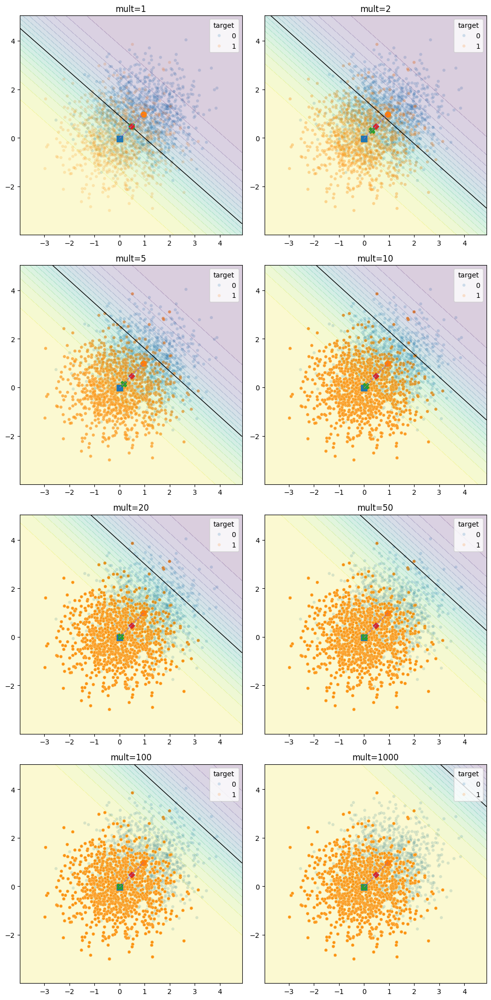

In [11]:
display_multipliers = [1,2,5,10,20,50,100,1000]

for m in display_multipliers:
    dfm = repeat_df_dict[m]
    df_sub = dfm[dfm['target'].isin(class_pair)].copy()

    centers = {
        cls: df_sub[df_sub['target']==cls][list(feat_pair)].mean().values
        for cls in class_pair
    }
    overall_center = df_sub[list(feat_pair)].mean().values
    midpoint = (centers[class_pair[0]] + centers[class_pair[1]]) / 2

    table = pd.DataFrame({
        'point': [f'class_{class_pair[0]}_center',
                  f'class_{class_pair[1]}_center',
                  'overall_center',
                  'midpoint'],
        'x': [centers[class_pair[0]][0],
              centers[class_pair[1]][0],
              overall_center[0],
              midpoint[0]],
        'y': [centers[class_pair[0]][1],
              centers[class_pair[1]][1],
              overall_center[1],
              midpoint[1]]
    })
    print(f"mult={m} — centers (features {feat_pair}):")
    display(table)

n = len(display_multipliers)

fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
axes = axes.flatten()

for idx, m in enumerate(display_multipliers):
    dfm = repeat_df_dict[m]
    df_sub = dfm[dfm['target'].isin(class_pair)].copy()
    X = df_sub[list(feat_pair)].values
    y = (df_sub['target'] == target_positive).astype(int)

    lda = LinearDiscriminantAnalysis().fit(X, y)

    xx_min, xx_max = X[:,0].min()-1, X[:,0].max()+1
    yy_min, yy_max = X[:,1].min()-1, X[:,1].max()+1
    xx, yy = np.meshgrid(np.linspace(xx_min, xx_max, 300),
                         np.linspace(yy_min, yy_max, 300))
    prob_grid = lda.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,1].reshape(xx.shape)

    centers = {
        cls: df_sub[df_sub['target']==cls][list(feat_pair)].mean().values
        for cls in class_pair
    }
    overall_center = df_sub[list(feat_pair)].mean().values
    midpoint = (centers[class_pair[0]] + centers[class_pair[1]]) / 2

    ax = axes[idx]
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, alpha=0.2, s=20, ax=ax)
    ax.contourf(xx, yy, prob_grid, levels=20, alpha=0.2)
    ax.contour(xx, yy, prob_grid, levels=[0.5], colors='k', linewidths=1)

    ax.plot(*centers[class_pair[0]], 's', markersize=8)
    ax.plot(*centers[class_pair[1]], 'o', markersize=8)
    ax.plot(*overall_center, 'X', markersize=8)
    ax.plot(*midpoint, 'D', markersize=6)
    ax.plot([centers[class_pair[0]][0], centers[class_pair[1]][0]],
            [centers[class_pair[0]][1], centers[class_pair[1]][1]],
            '--', linewidth=1)

    ax.set_title(f"mult={m}")

for j in range(idx+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### [5] Выбрать целевой класс для решений из пункта [3].
Для каждого из решений из пункта [3], оценить качество работы полученных на основе LDA классификаторов, используя ROC кривые и восстановив на графике каждой ROC кривой соответствующие решению LDA 95% доверительные полосы (Confidence bands 95%) этой ROC кривой бутстрепом (n=1000 или больше). Для каждой кривой численно также отобразить метрику AUROС (AUC для ROC кривой классификации Sensitivity-Specificity и ее доверительные интервалы CI95).

*Все полученные графики возможно расположить в две колонки: левая колонка –
визуализация пространства и решений LDA, правая – графики с ROC кривой и
доверительными полосами.*

In [ ]:
def compute_roc_curve(y_true: np.ndarray, y_probs: np.ndarray, thresholds: np.ndarray, compute_auc: bool = True):
    y_true = np.asarray(y_true)
    y_probs = np.asarray(y_probs)
    y_true_inv = (y_true == 0)
    num_of_pos = int(y_true.sum())
    num_of_neg = int(y_true.size - num_of_pos)
    specifity_values = np.empty((thresholds.size,))
    sensitivity_values = np.empty((thresholds.size,))
    for i, threshold in enumerate(thresholds):
        y_pred = (y_probs >= threshold).astype(int)

        if num_of_pos == 0:
            sensitivity_values[i] = 0.0
        else:
            sensitivity_values[i] = float((y_pred * y_true).sum()) / num_of_pos

        if num_of_neg == 0:
            specifity_values[i] = 0.0
        else:
            specifity_values[i] = float(((y_pred == 0) & y_true_inv).sum()) / num_of_neg
    auroc = auc(specifity_values, sensitivity_values) if compute_auc else None
    return specifity_values, sensitivity_values, auroc

def draw_roc(specifity_values: np.ndarray, sensitivity_values: np.ndarray, auroc: float, ax: plt.Axes, color: str = "b"):
    ax.plot(specifity_values, sensitivity_values, color+"-", linewidth=2, label=f"ROC curve, AUROC = {auroc:.3f}")
    ax.set_aspect("equal")
    ax.set_xlim(1.05, -0.05)   
    ax.set_xlabel("specificity")
    ax.set_ylim(-0.05, 1.05)
    ax.set_ylabel("sensitivity")
    ax.grid()
    ax.legend()

def compute_ci(arr2d: np.ndarray, ci: float):
    low_q = ((1.0 - ci) / 2.0) * 100.0
    high_q = (ci + (1.0 - ci) / 2.0) * 100.0
    lower = np.percentile(arr2d, low_q, axis=0)
    upper = np.percentile(arr2d, high_q, axis=0)
    return lower, upper

def compute_roc_ci(specifity_mean: np.ndarray, y_true: np.ndarray, y_probs: np.ndarray, n_bootstraps: int, ci: float, thresholds: np.ndarray):
    y_true = np.asarray(y_true)
    y_probs = np.asarray(y_probs)
    n = int(len(y_true))
    sensitivity_interps = np.empty((n_bootstraps, specifity_mean.size))
    rng = np.random.RandomState(0)
    for i in range(n_bootstraps):
        idx = rng.randint(0, n, n)
        y_true_resampled = y_true[idx]
        y_probs_resampled = y_probs[idx]
        specifity_values, sensitivity_values, _ = compute_roc_curve(y_true_resampled, y_probs_resampled, thresholds, compute_auc=False)
        sensitivity_interps[i] = np.interp(specifity_mean, specifity_values, sensitivity_values)
    lower, upper = compute_ci(sensitivity_interps, ci)
    return lower, upper

In [ ]:
def roc_bootstrap_train_on_test(Cls, X_tr, y_tr, X_te, y_te, n_bootstrap=1000, fpr_grid=None, seed=42, alpha=0.95):
    rng = np.random.default_rng(seed)
    
    if fpr_grid is None:
        fpr_grid = np.linspace(0, 1, 200)

    tprs = []
    aucs = []

    for _ in range(n_bootstrap):
        idx = rng.choice(len(X_tr), size=len(X_tr), replace=True)
        X_bs = X_tr[idx] + rng.normal(0, 0.05, X_tr[idx].shape) 
        y_bs = y_tr[idx]

        clf = Cls()
        clf.fit(X_bs, y_bs)
        probs_te = clf.predict_proba(X_te)[:,1]

        fpr, tpr, _ = roc_curve(y_te, probs_te)
        tpr_interp = np.interp(fpr_grid, fpr, tpr)
        tprs.append(tpr_interp)
        aucs.append(roc_auc_score(y_te, probs_te))

    tprs = np.array(tprs)
    base_tpr = tprs.mean(axis=0)
    lower_tpr = np.percentile(tprs, (1-alpha)/2*100, axis=0)
    upper_tpr = np.percentile(tprs, (1+alpha)/2*100, axis=0)

    auc_mean = np.mean(aucs)
    auc_ci = np.percentile(aucs, [(1-alpha)/2*100, (1+alpha)/2*100])

    return fpr_grid, base_tpr, lower_tpr, upper_tpr, auc_mean, auc_ci

In [ ]:
thresholds = np.linspace(0.0, 1.0, 201) 
n_bootstrap_local = 1000
ci_level = 0.95

===== mult = 1 =====


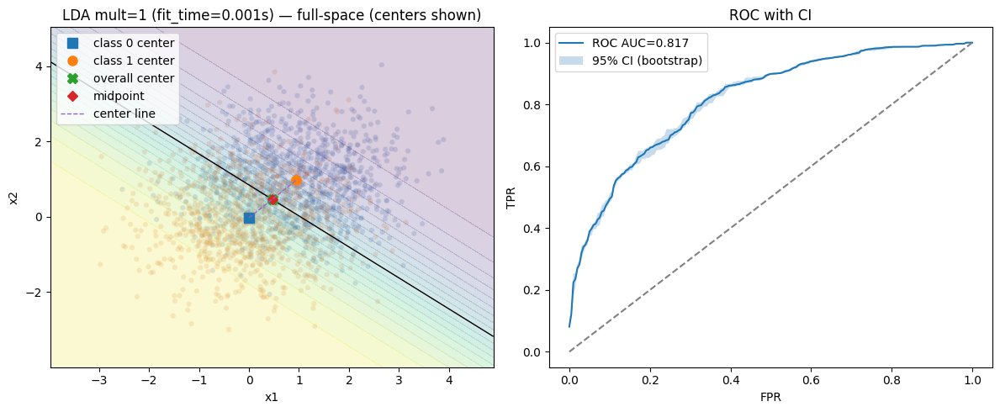

mult=1 | ROC AUC mean 0.8170 CI95 [0.8130, 0.8197]

===== mult = 2 =====


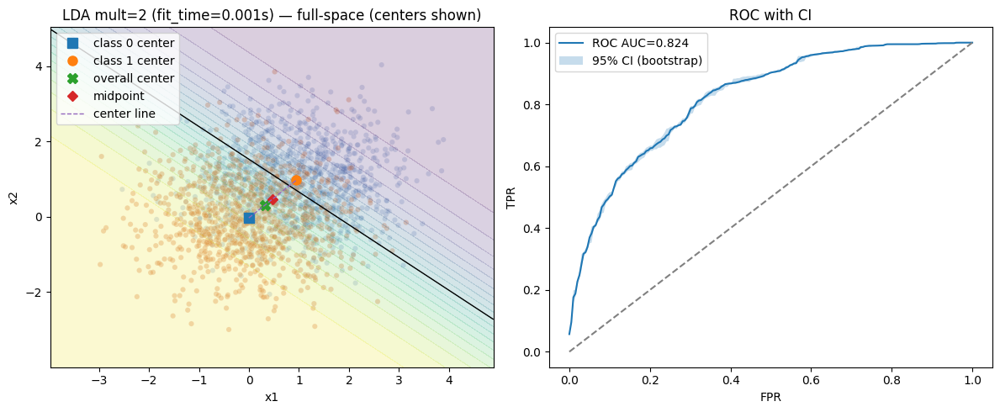

mult=2 | ROC AUC mean 0.8240 CI95 [0.8219, 0.8252]

===== mult = 5 =====


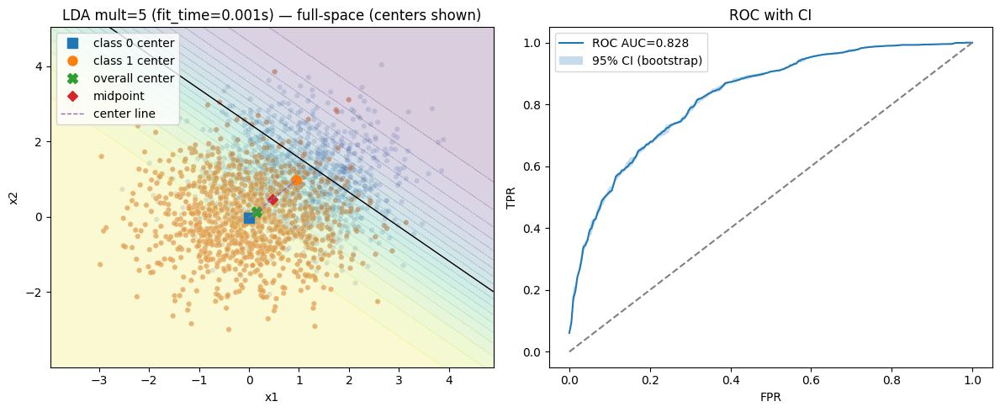

mult=5 | ROC AUC mean 0.8283 CI95 [0.8277, 0.8284]

===== mult = 10 =====


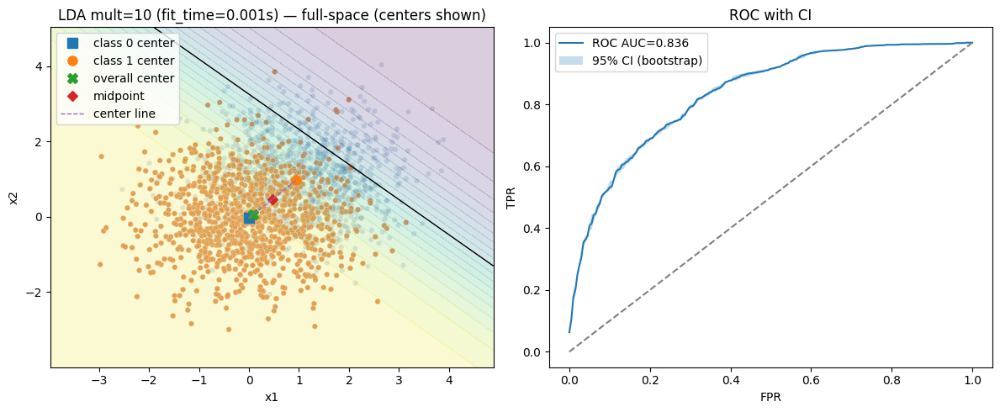

mult=10 | ROC AUC mean 0.8358 CI95 [0.8353, 0.8360]

===== mult = 20 =====


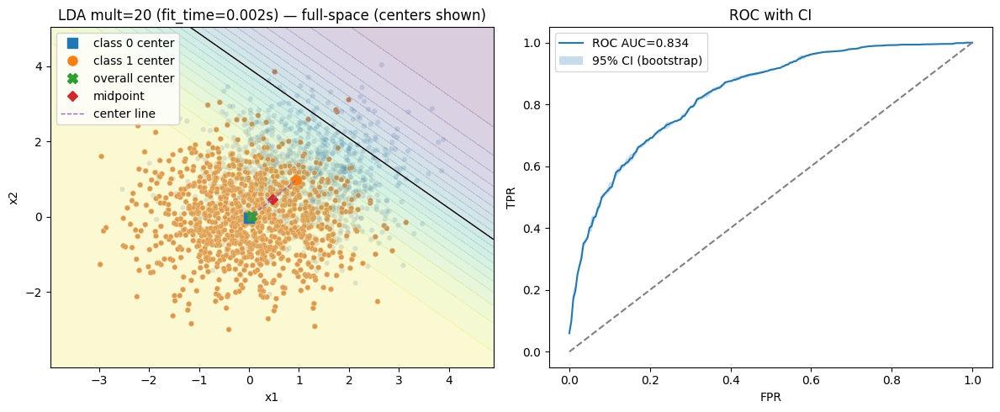

mult=20 | ROC AUC mean 0.8340 CI95 [0.8335, 0.8342]

===== mult = 50 =====


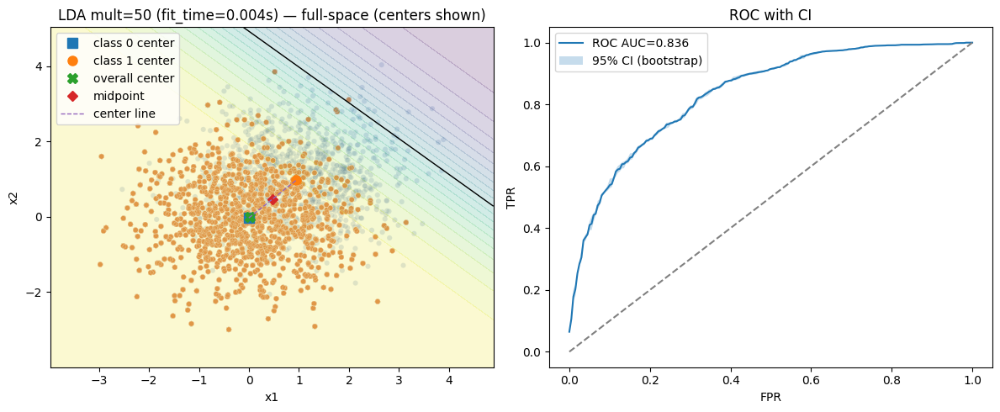

mult=50 | ROC AUC mean 0.8359 CI95 [0.8349, 0.8362]

===== mult = 100 =====


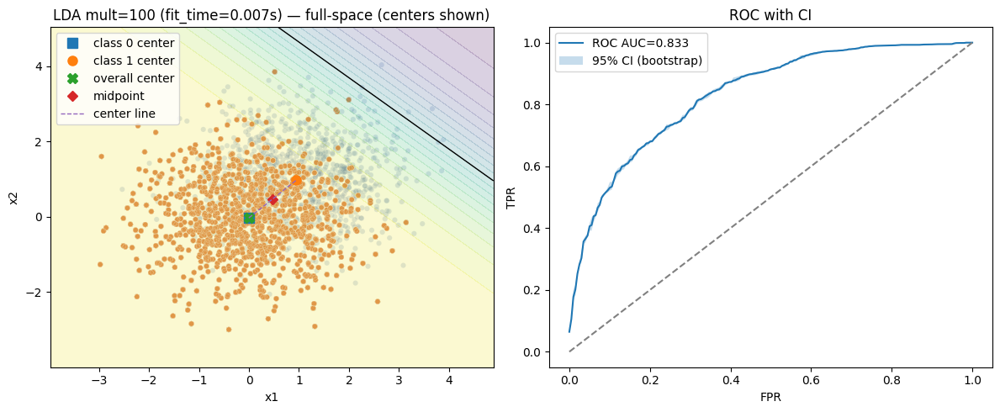

mult=100 | ROC AUC mean 0.8330 CI95 [0.8323, 0.8333]

===== mult = 1000 =====


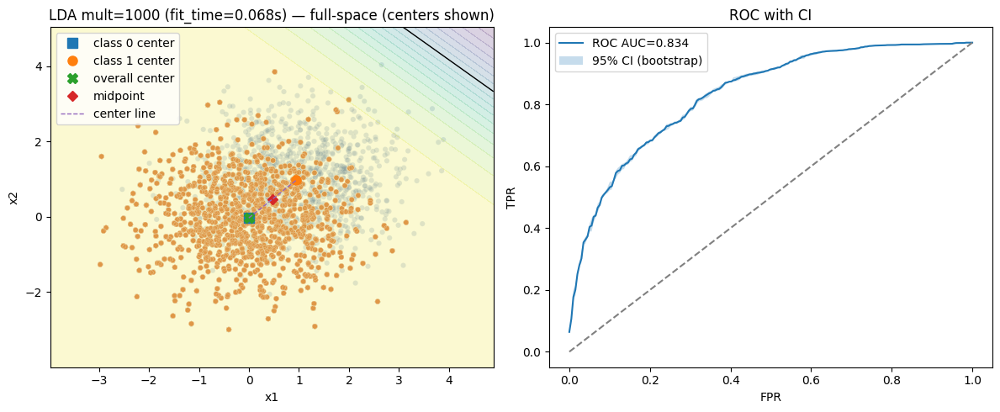

mult=1000 | ROC AUC mean 0.8337 CI95 [0.8330, 0.8340]

===== mult = 10000 =====


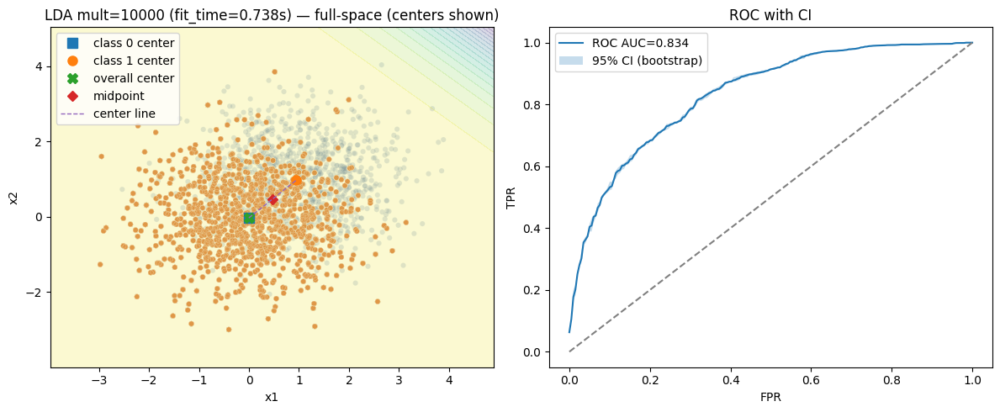

mult=10000 | ROC AUC mean 0.8337 CI95 [0.8330, 0.8340]



In [ ]:
for m in multipliers:
    print("===== mult =", m, "=====")
    dfm = repeat_df_dict[m]
    df_sub = dfm[dfm['target'].isin(class_pair)].copy()
    X_full = df_sub[list(feat_pair)].values
    y_full = (df_sub['target'] == target_positive).astype(int).values

    X_tr, X_te, y_tr, y_te = train_test_split(
        X_full, y_full, test_size=0.3, stratify=y_full, random_state=42
    )

    lda = LinearDiscriminantAnalysis()
    t0 = time.time()
    lda.fit(X_tr, y_tr)
    t_fit = time.time() - t0
    probs_te = lda.predict_proba(X_te)[:,1]

    fpr_g, base_tpr, lower_tpr, upper_tpr, auc_mean, auc_ci = roc_bootstrap_train_on_test(
        LinearDiscriminantAnalysis, X_tr, y_tr, X_te, y_te,
        n_bootstrap=n_bootstrap_local, fpr_grid=np.linspace(0,1,200),
        seed=42, alpha=ci_level
    )

    base_tpr = np.clip(base_tpr, 0, 1)
    lower_tpr = np.clip(lower_tpr, 0, 1)
    upper_tpr = np.clip(upper_tpr, 0, 1)

    xx_min, xx_max = X_full[:,0].min()-1, X_full[:,0].max()+1
    yy_min, yy_max = X_full[:,1].min()-1, X_full[:,1].max()+1
    xx, yy = np.meshgrid(np.linspace(xx_min, xx_max, 300),
                         np.linspace(yy_min, yy_max, 300))
    grid = np.c_[xx.ravel(), yy.ravel()]
    prob_grid = lda.predict_proba(grid)[:,1].reshape(xx.shape)

    centers = {cls: df_sub[df_sub['target']==cls][list(feat_pair)].mean().values
               for cls in class_pair}
    overall_center = df_sub[list(feat_pair)].mean().values
    midpoint = (centers[class_pair[0]] + centers[class_pair[1]]) / 2

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))

    sns.scatterplot(x=X_full[:,0], y=X_full[:,1], hue=y_full, alpha=0.2, s=20, ax=ax1, palette='deep', legend=False)
    ax1.contourf(xx, yy, prob_grid, levels=20, alpha=0.2)
    ax1.contour(xx, yy, prob_grid, levels=[0.5], colors='k', linewidths=1)
    ax1.plot(*centers[class_pair[0]], 's', markersize=8, label=f'class {class_pair[0]} center')
    ax1.plot(*centers[class_pair[1]], 'o', markersize=8, label=f'class {class_pair[1]} center')
    ax1.plot(*overall_center, 'X', markersize=8, label='overall center')
    ax1.plot(*midpoint, 'D', markersize=6, label='midpoint')
    ax1.plot([centers[class_pair[0]][0], centers[class_pair[1]][0]],
             [centers[class_pair[0]][1], centers[class_pair[1]][1]],
             '--', linewidth=1, label='center line')
    ax1.set_xlabel(feat_pair[0])
    ax1.set_ylabel(feat_pair[1])
    ax1.set_title(f"LDA mult={m} (fit_time={t_fit:.3f}s) — full-space (centers shown)")
    ax1.legend(loc='best')

    ax2.plot(fpr_g, base_tpr, label=f'ROC AUC={auc_mean:.3f}')
    ax2.fill_between(fpr_g, lower_tpr, upper_tpr, alpha=0.25, label=f'{int(ci_level*100)}% CI (bootstrap)')
    ax2.plot([0,1],[0,1],'--', color='gray')
    ax2.set_xlabel("FPR"); ax2.set_ylabel("TPR"); ax2.set_title("ROC with CI")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    print(f"mult={m} | ROC AUC mean {auc_mean:.4f} CI95 [{auc_ci[0]:.4f}, {auc_ci[1]:.4f}]\n")


### [6] Повторить пункт [5] для PR кривых и отобразить метрику AUPRC (AUC для PR).

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

def compute_pr_curve(y_true: np.ndarray, y_probs: np.ndarray, thresholds: np.ndarray = None, compute_auc: bool = True):
    y_true = np.asarray(y_true)
    y_probs = np.asarray(y_probs)
    precision, recall, pr_thresholds = precision_recall_curve(y_true, y_probs)
    auprc = average_precision_score(y_true, y_probs) if compute_auc else None

    if thresholds is not None:
        recall_interp = np.interp(thresholds, pr_thresholds, recall[:-1], left=0, right=0)
        precision_interp = np.interp(thresholds, pr_thresholds, precision[:-1], left=1, right=0)
        return precision_interp, recall_interp, auprc
    return precision, recall, auprc

def draw_pr(precision: np.ndarray, recall: np.ndarray, auprc: float, ax: plt.Axes, color: str = "b"):
    ax.plot(recall, precision, color+"-", linewidth=2, label=f"PR curve, AUPRC = {auprc:.3f}")
    ax.set_xlabel("Recall")
    ax.set_ylabel("Precision")
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.05, 1.05)
    ax.grid()
    ax.legend()

def compute_pr_ci(precision_mean: np.ndarray, y_true: np.ndarray, y_probs: np.ndarray, n_bootstraps: int, ci: float, thresholds: np.ndarray):
    y_true = np.asarray(y_true)
    y_probs = np.asarray(y_probs)
    n = len(y_true)
    precision_interps = np.empty((n_bootstraps, thresholds.size))
    rng = np.random.RandomState(0)
    for i in range(n_bootstraps):
        idx = rng.randint(0, n, n)
        y_true_resampled = y_true[idx]
        y_probs_resampled = y_probs[idx]
        prec, rec, _ = compute_pr_curve(y_true_resampled, y_probs_resampled)
        precision_interps[i] = np.interp(thresholds, rec[::-1], prec[::-1])
    lower, upper = compute_ci(precision_interps, ci)
    return lower, upper


In [ ]:
def pr_bootstrap_train_on_test(Cls, X_tr, y_tr, X_te, y_te, n_bootstrap=1000, recall_grid=None, seed=42, alpha=0.95):
    rng = np.random.default_rng(seed)
    base_prec = np.zeros_like(recall_grid)
    auc_list = []
    n_points = len(recall_grid)

    for i in range(n_bootstrap):
        idx = rng.choice(len(X_tr), size=len(X_tr), replace=True)
        X_bs = X_tr[idx] + rng.normal(0, 0.05, X_tr[idx].shape)
        y_bs = y_tr[idx]
        clf = Cls()
        clf.fit(X_bs, y_bs)
        probs = clf.predict_proba(X_te)[:,1]
        precision, recall, _ = precision_recall_curve(y_te, probs)
        prec_interp = np.interp(recall_grid, recall[::-1], precision[::-1])  # интерполируем
        base_prec += prec_interp
        auc_list.append(average_precision_score(y_te, probs))

    base_prec /= n_bootstrap

    precision_matrix = np.zeros((n_bootstrap, n_points))
    for i in range(n_bootstrap):
        idx = rng.choice(len(X_tr), size=len(X_tr), replace=True)
        X_bs = X_tr[idx] + rng.normal(0, 0.05, X_tr[idx].shape)
        y_bs = y_tr[idx]
        clf = Cls()
        clf.fit(X_bs, y_bs)
        probs = clf.predict_proba(X_te)[:,1]
        precision, recall, _ = precision_recall_curve(y_te, probs)
        precision_matrix[i] = np.interp(recall_grid, recall[::-1], precision[::-1])

    lower_prec = np.percentile(precision_matrix, (1-alpha)/2*100, axis=0)
    upper_prec = np.percentile(precision_matrix, (1+alpha)/2*100, axis=0)

    mean_auprc = np.mean(auc_list)
    auprc_ci = np.percentile(auc_list, [2.5, 97.5])

    return recall_grid, base_prec, lower_prec, upper_prec, mean_auprc, auprc_ci

===== mult = 1 =====


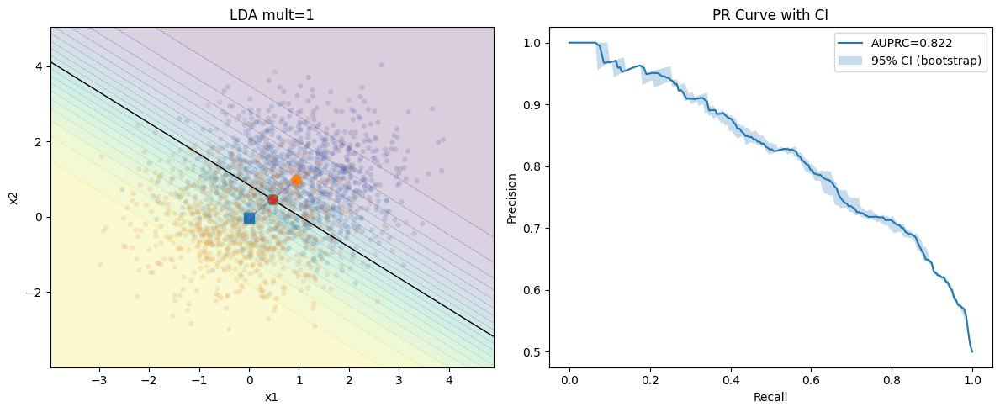

mult=1 | AUPRC mean 0.8215 CI95 [0.8185, 0.8233]

===== mult = 2 =====


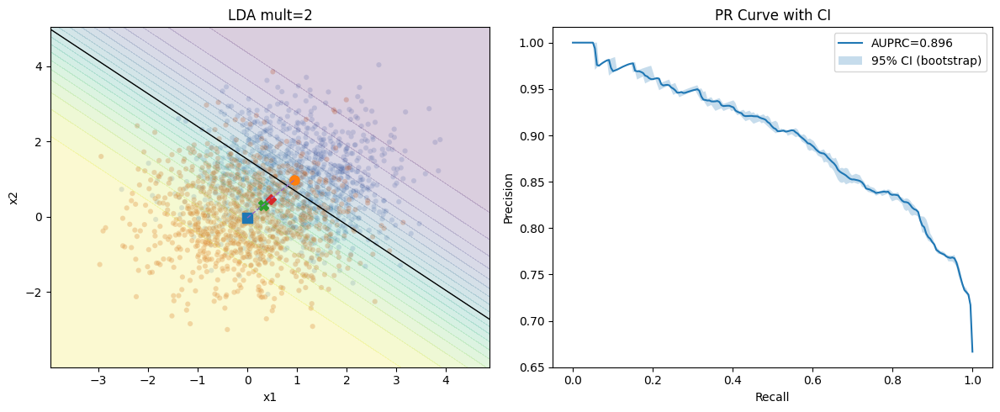

mult=2 | AUPRC mean 0.8959 CI95 [0.8950, 0.8965]

===== mult = 5 =====


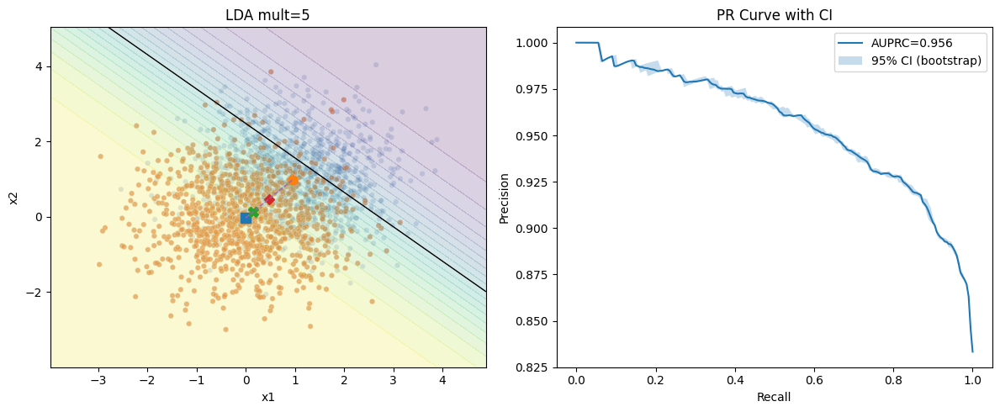

mult=5 | AUPRC mean 0.9557 CI95 [0.9555, 0.9558]

===== mult = 10 =====


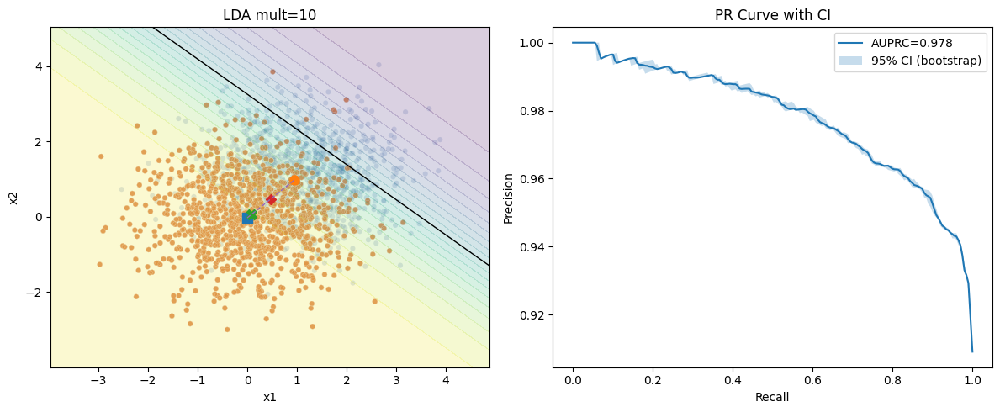

mult=10 | AUPRC mean 0.9781 CI95 [0.9780, 0.9782]

===== mult = 20 =====


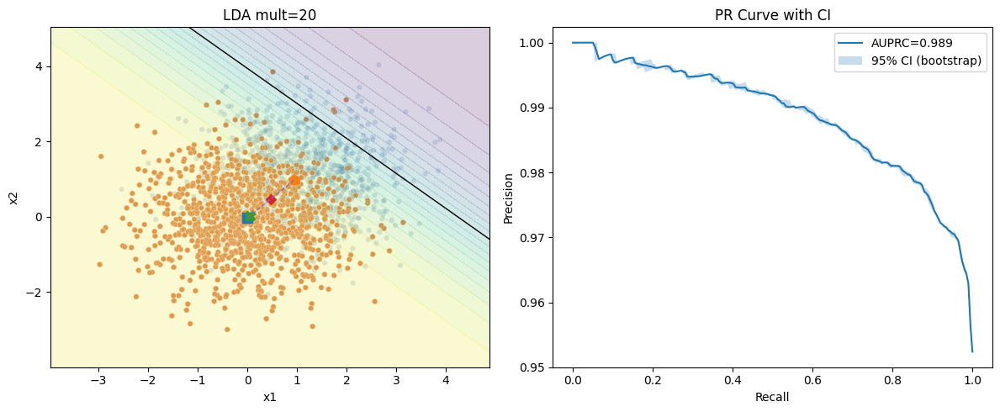

mult=20 | AUPRC mean 0.9887 CI95 [0.9887, 0.9887]

===== mult = 50 =====


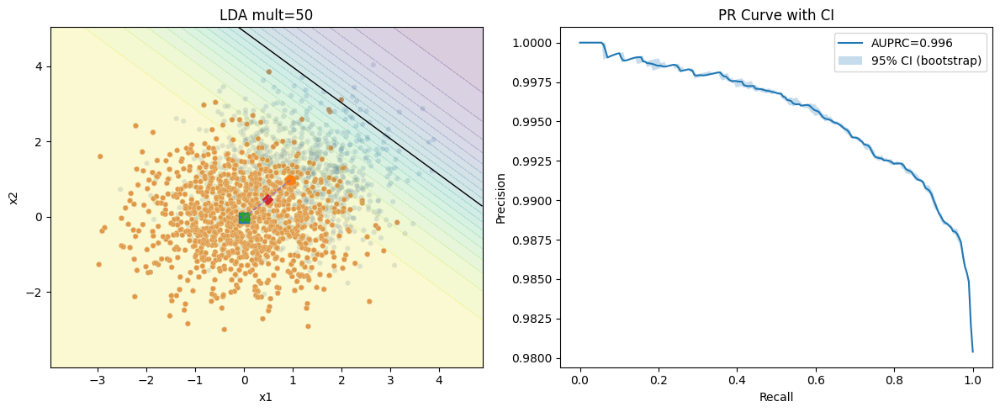

mult=50 | AUPRC mean 0.9955 CI95 [0.9955, 0.9955]

===== mult = 100 =====


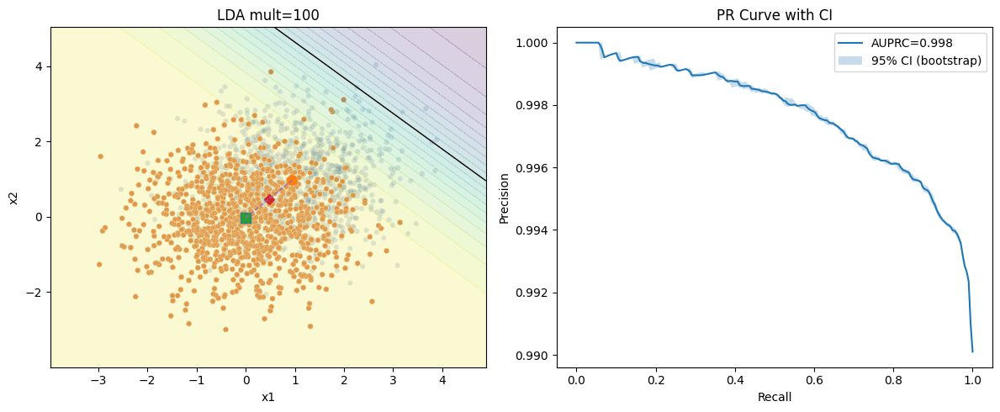

mult=100 | AUPRC mean 0.9977 CI95 [0.9977, 0.9977]

===== mult = 1000 =====


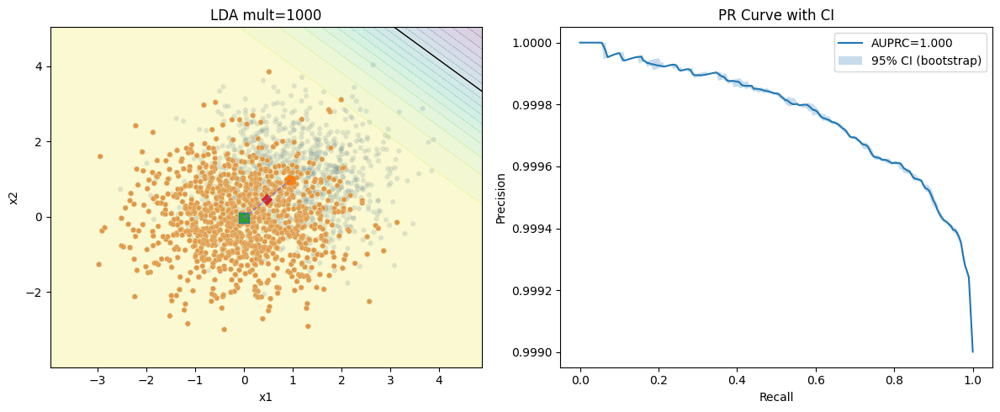

mult=1000 | AUPRC mean 0.9998 CI95 [0.9998, 0.9998]

===== mult = 10000 =====


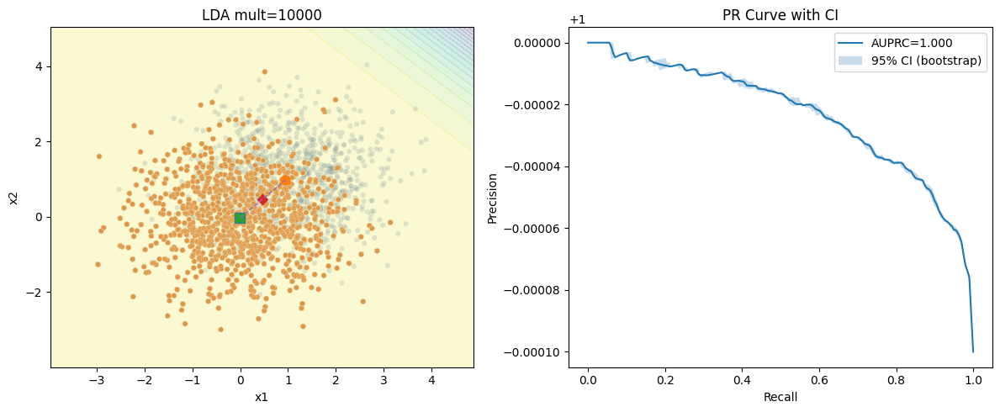

mult=10000 | AUPRC mean 1.0000 CI95 [1.0000, 1.0000]



In [ ]:
recall_grid = np.linspace(0, 1, 200)
n_bootstrap_local = 1000
ci_level = 0.95

for m in multipliers:
    print("===== mult =", m, "=====")
    dfm = repeat_df_dict[m]
    df_sub = dfm[dfm['target'].isin(class_pair)].copy()
    X_full = df_sub[list(feat_pair)].values
    y_full = (df_sub['target'] == target_positive).astype(int).values

    X_tr, X_te, y_tr, y_te = train_test_split(
        X_full, y_full, test_size=0.3, stratify=y_full, random_state=42
    )

    lda = LinearDiscriminantAnalysis()
    lda.fit(X_tr, y_tr)
    probs_te = lda.predict_proba(X_te)[:,1]

    recall_g, base_prec, lower_prec, upper_prec, auprc_mean, auprc_ci = pr_bootstrap_train_on_test(
        LinearDiscriminantAnalysis, X_tr, y_tr, X_te, y_te,
        n_bootstrap=n_bootstrap_local, recall_grid=recall_grid, seed=42, alpha=ci_level
    )

    xx_min, xx_max = X_full[:,0].min()-1, X_full[:,0].max()+1
    yy_min, yy_max = X_full[:,1].min()-1, X_full[:,1].max()+1
    xx, yy = np.meshgrid(np.linspace(xx_min, xx_max, 300),
                         np.linspace(yy_min, yy_max, 300))
    grid = np.c_[xx.ravel(), yy.ravel()]
    prob_grid = lda.predict_proba(grid)[:,1].reshape(xx.shape)

    centers = {cls: df_sub[df_sub['target']==cls][list(feat_pair)].mean().values
               for cls in class_pair}
    overall_center = df_sub[list(feat_pair)].mean().values
    midpoint = (centers[class_pair[0]] + centers[class_pair[1]]) / 2

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))

    sns.scatterplot(x=X_full[:,0], y=X_full[:,1], hue=y_full, alpha=0.2, s=20, ax=ax1, palette='deep', legend=False)
    ax1.contourf(xx, yy, prob_grid, levels=20, alpha=0.2)
    ax1.contour(xx, yy, prob_grid, levels=[0.5], colors='k', linewidths=1)
    ax1.plot(*centers[class_pair[0]], 's', markersize=8)
    ax1.plot(*centers[class_pair[1]], 'o', markersize=8)
    ax1.plot(*overall_center, 'X', markersize=8)
    ax1.plot(*midpoint, 'D', markersize=6)
    ax1.plot([centers[class_pair[0]][0], centers[class_pair[1]][0]],
             [centers[class_pair[0]][1], centers[class_pair[1]][1]],
             '--', linewidth=1)
    ax1.set_title(f"LDA mult={m}")
    ax1.set_xlabel(feat_pair[0])
    ax1.set_ylabel(feat_pair[1])

    ax2.plot(recall_g, base_prec, label=f'AUPRC={auprc_mean:.3f}')
    ax2.fill_between(recall_g, lower_prec, upper_prec, alpha=0.25, label=f'{int(ci_level*100)}% CI (bootstrap)')
    ax2.set_xlabel("Recall"); ax2.set_ylabel("Precision"); ax2.set_title("PR Curve with CI")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    print(f"mult={m} | AUPRC mean {auprc_mean:.4f} CI95 [{auprc_ci[0]:.4f}, {auprc_ci[1]:.4f}]\n")


### [7] В пункте [5] выбрать другой целевой класс и повторить отдельно визуализации ROC кривых.

===== mult = 1 =====


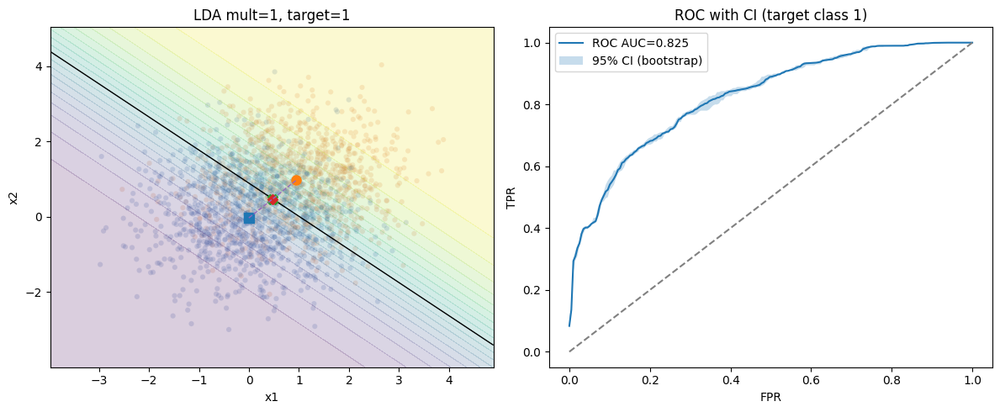

mult=1 | ROC AUC mean 0.8248 CI95 [0.8222, 0.8265]

===== mult = 2 =====


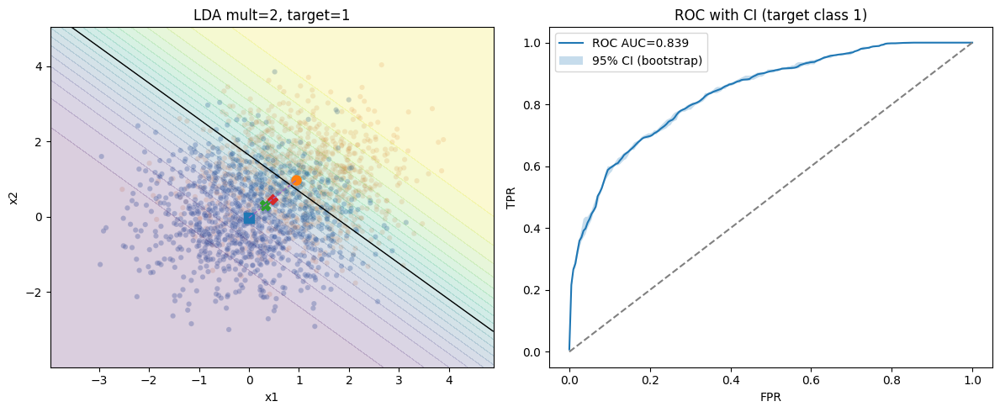

mult=2 | ROC AUC mean 0.8392 CI95 [0.8371, 0.8404]

===== mult = 5 =====


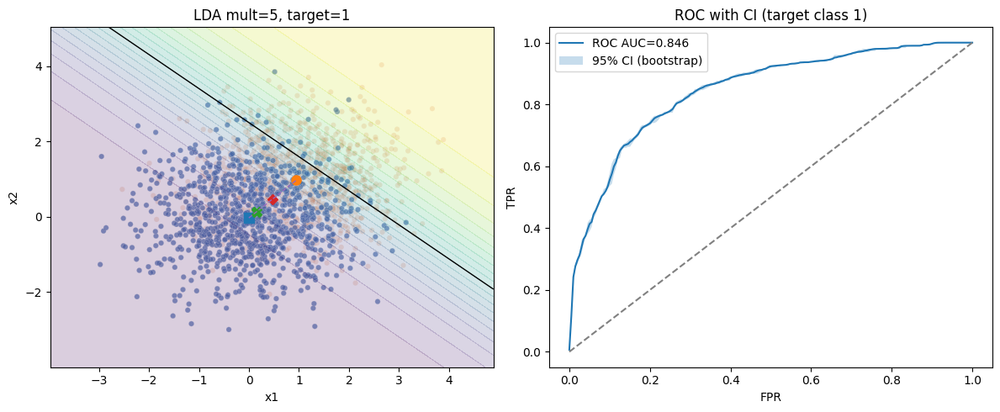

mult=5 | ROC AUC mean 0.8456 CI95 [0.8449, 0.8459]

===== mult = 10 =====


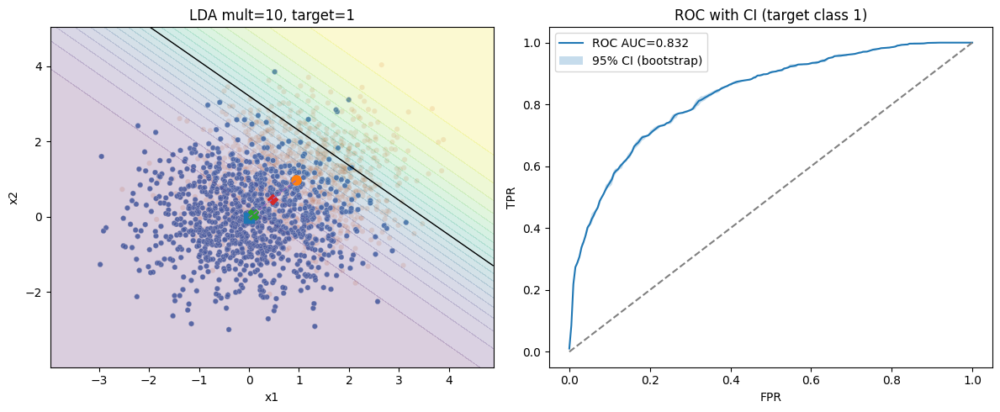

mult=10 | ROC AUC mean 0.8322 CI95 [0.8315, 0.8325]

===== mult = 20 =====


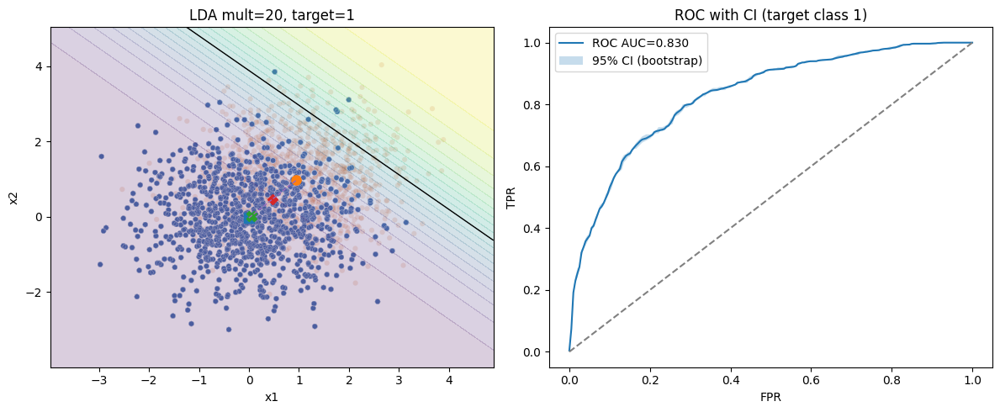

mult=20 | ROC AUC mean 0.8301 CI95 [0.8295, 0.8305]

===== mult = 50 =====


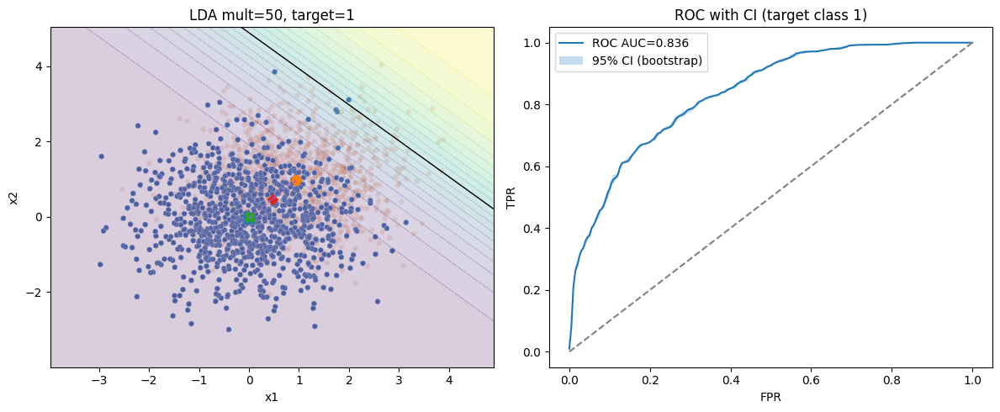

mult=50 | ROC AUC mean 0.8355 CI95 [0.8344, 0.8364]

===== mult = 100 =====


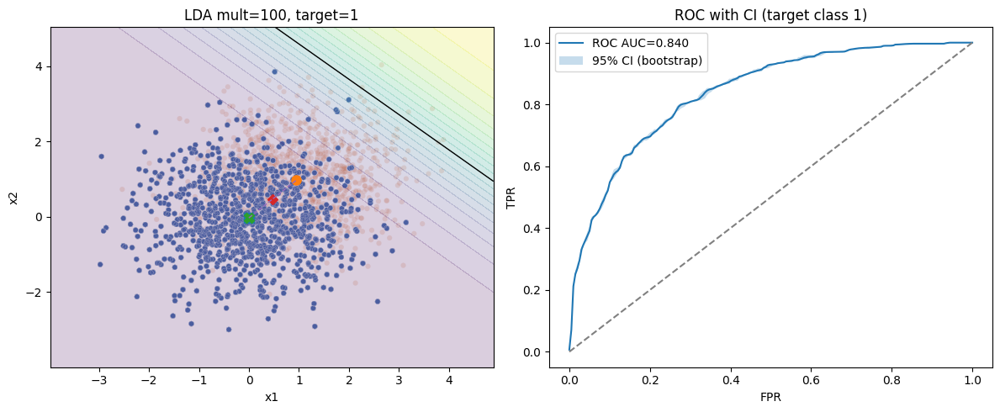

mult=100 | ROC AUC mean 0.8398 CI95 [0.8393, 0.8400]

===== mult = 1000 =====


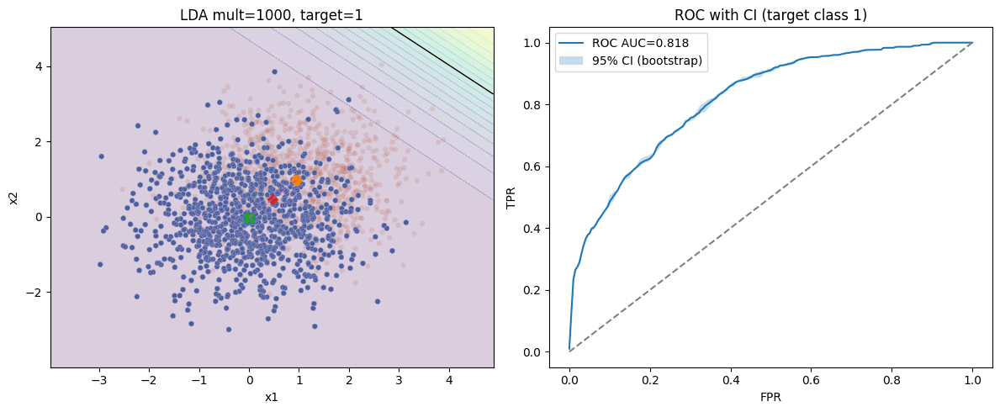

mult=1000 | ROC AUC mean 0.8177 CI95 [0.8155, 0.8196]

===== mult = 10000 =====


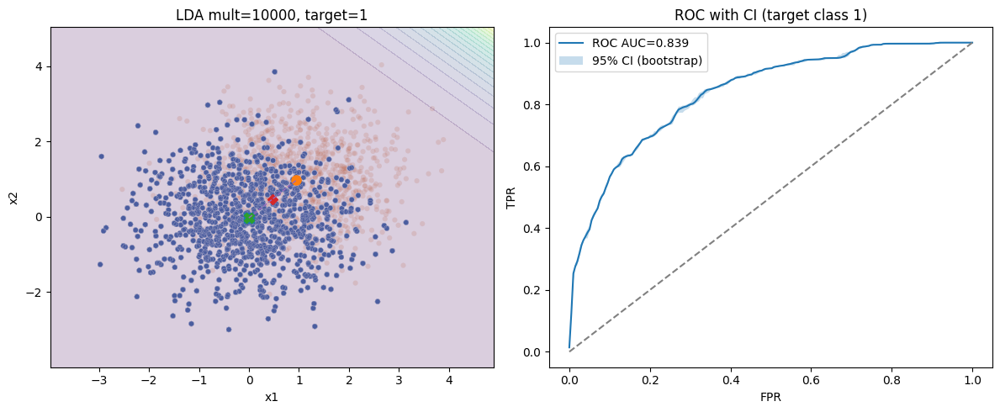

mult=10000 | ROC AUC mean 0.8386 CI95 [0.8383, 0.8388]



In [ ]:
target_positive_new = class_pair[1]
ci_level = 0.95
n_bootstrap_local = 1000
fpr_grid = np.linspace(0, 1, 200)

for m in multipliers:
    print("===== mult =", m, "=====")
    dfm = repeat_df_dict[m]
    df_sub = dfm[dfm['target'].isin(class_pair)].copy()
    
    X_full = df_sub[list(feat_pair)].values
    y_full = (df_sub['target'] == target_positive_new).astype(int).values

    X_tr, X_te, y_tr, y_te = train_test_split(
        X_full, y_full, test_size=0.3, stratify=y_full, random_state=42
    )

    lda = LinearDiscriminantAnalysis()
    lda.fit(X_tr, y_tr)
    probs_te = lda.predict_proba(X_te)[:,1]

    fpr_g, base_tpr, lower_tpr, upper_tpr, auc_mean, auc_ci = roc_bootstrap_train_on_test(
        LinearDiscriminantAnalysis, X_tr, y_tr, X_te, y_te,
        n_bootstrap=n_bootstrap_local, fpr_grid=fpr_grid, seed=42, alpha=ci_level
    )

    base_tpr = np.clip(base_tpr, 0, 1)
    lower_tpr = np.clip(lower_tpr, 0, 1)
    upper_tpr = np.clip(upper_tpr, 0, 1)

    xx_min, xx_max = X_full[:,0].min()-1, X_full[:,0].max()+1
    yy_min, yy_max = X_full[:,1].min()-1, X_full[:,1].max()+1
    xx, yy = np.meshgrid(np.linspace(xx_min, xx_max, 300),
                         np.linspace(yy_min, yy_max, 300))
    grid = np.c_[xx.ravel(), yy.ravel()]
    prob_grid = lda.predict_proba(grid)[:,1].reshape(xx.shape)

    centers = {cls: df_sub[df_sub['target']==cls][list(feat_pair)].mean().values
               for cls in class_pair}
    overall_center = df_sub[list(feat_pair)].mean().values
    midpoint = (centers[class_pair[0]] + centers[class_pair[1]]) / 2

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))

    sns.scatterplot(x=X_full[:,0], y=X_full[:,1], hue=y_full, alpha=0.2, s=20, ax=ax1, palette='deep', legend=False)
    ax1.contourf(xx, yy, prob_grid, levels=20, alpha=0.2)
    ax1.contour(xx, yy, prob_grid, levels=[0.5], colors='k', linewidths=1)
    ax1.plot(*centers[class_pair[0]], 's', markersize=8)
    ax1.plot(*centers[class_pair[1]], 'o', markersize=8)
    ax1.plot(*overall_center, 'X', markersize=8)
    ax1.plot(*midpoint, 'D', markersize=6)
    ax1.plot([centers[class_pair[0]][0], centers[class_pair[1]][0]],
             [centers[class_pair[0]][1], centers[class_pair[1]][1]],
             '--', linewidth=1)
    ax1.set_title(f"LDA mult={m}, target={target_positive_new}")
    ax1.set_xlabel(feat_pair[0])
    ax1.set_ylabel(feat_pair[1])

    ax2.plot(fpr_g, base_tpr, label=f'ROC AUC={auc_mean:.3f}')
    ax2.fill_between(fpr_g, lower_tpr, upper_tpr, alpha=0.25, label=f'{int(ci_level*100)}% CI (bootstrap)')
    ax2.plot([0,1],[0,1],'--', color='gray')
    ax2.set_xlabel("FPR")
    ax2.set_ylabel("TPR")
    ax2.set_title("ROC with CI (target class 1)")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    print(f"mult={m} | ROC AUC mean {auc_mean:.4f} CI95 [{auc_ci[0]:.4f}, {auc_ci[1]:.4f}]\n")

### [8] Для датасета df10 на основе 3-fold, 5-fold, 10-fold, 20-fold, 50-fold, 100-fold кросс-валидации построить кривые AUROC и AUPRC c 95% доверительными полосами (CI95).
Вместо CI95 можно взять CI90, CI80 или другой квантиль доверительной полосы.

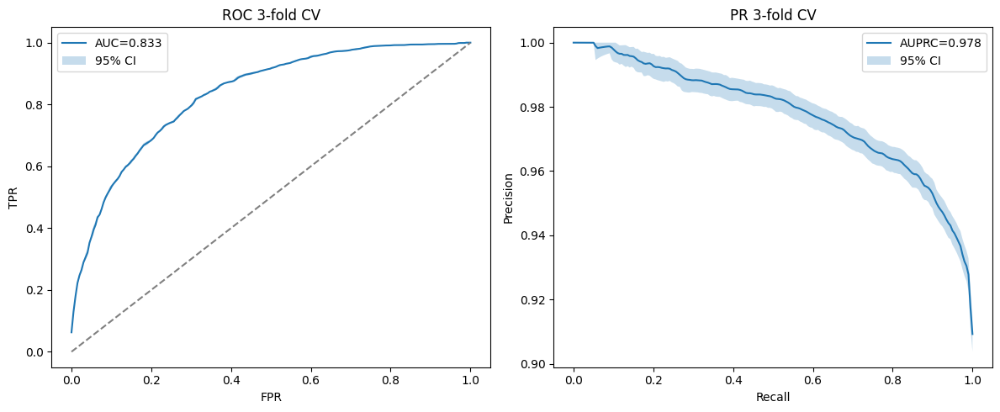

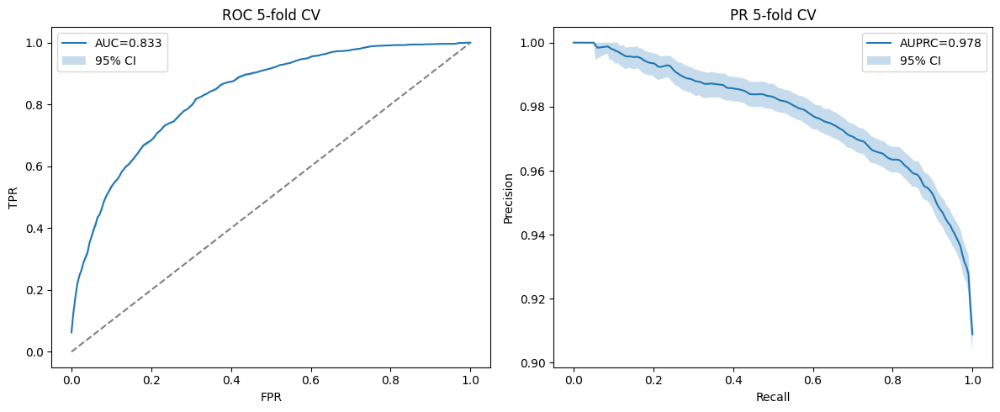

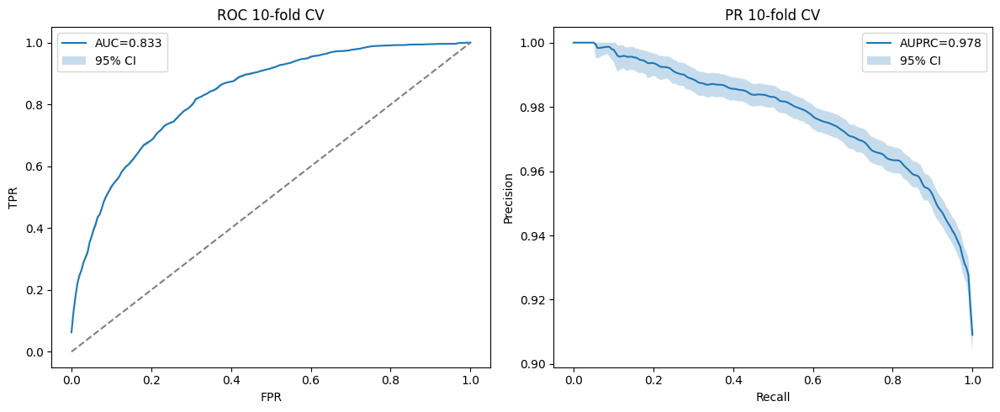

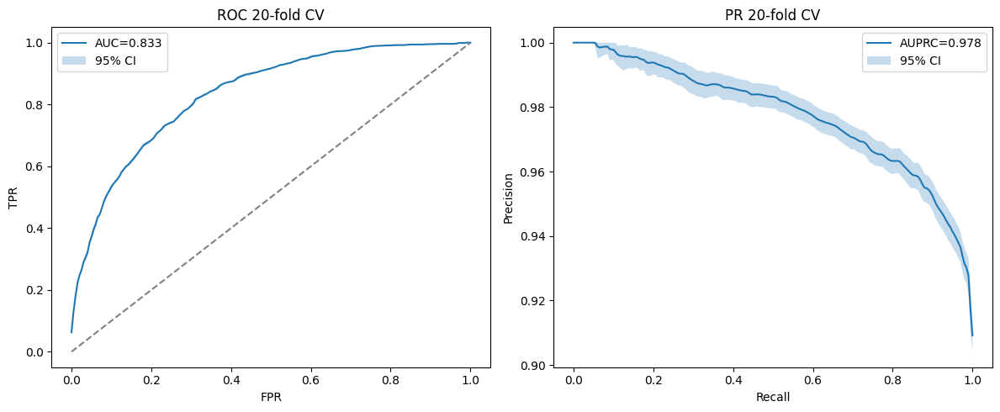

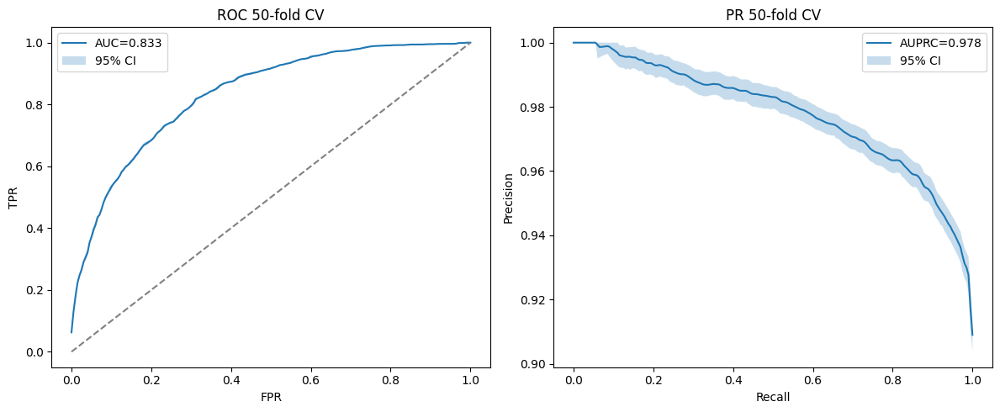

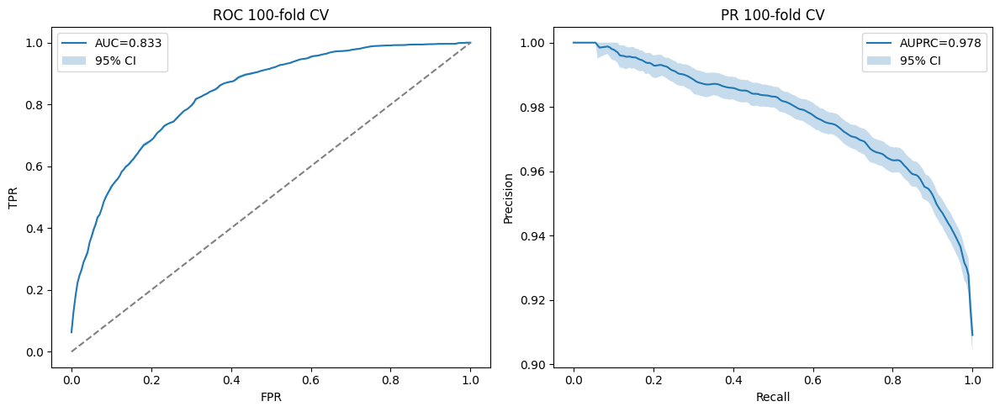

In [ ]:
def crossval_roc_pr_curves(Cls, X, y, n_splits_list, n_bootstrap=500, fpr_grid=None, recall_grid=None, ci=0.95, seed=42):
    rng = np.random.default_rng(seed)
    results = {}

    for k in n_splits_list:
        skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=seed)
        y_true_all = []
        y_probs_all = []

        for train_idx, test_idx in skf.split(X, y):
            X_tr, X_te = X[train_idx], X[test_idx]
            y_tr, y_te = y[train_idx], y[test_idx]

            clf = Cls()
            clf.fit(X_tr, y_tr)
            probs = clf.predict_proba(X_te)[:,1]

            y_true_all.append(y_te)
            y_probs_all.append(probs)

        y_true_all = np.concatenate(y_true_all)
        y_probs_all = np.concatenate(y_probs_all)

        fpr_grid_use = fpr_grid if fpr_grid is not None else np.linspace(0,1,200)
        fpr_g, base_tpr, lower_tpr, upper_tpr, auc_mean, auc_ci = roc_bootstrap_train_on_test(
            Cls, X, y, X, y, n_bootstrap=n_bootstrap, fpr_grid=fpr_grid_use, seed=seed, alpha=ci
        )

        recall_grid_use = recall_grid if recall_grid is not None else np.linspace(0,1,200)
        precision_list = []
        precision_interp_list = []

        for i in range(n_bootstrap):
            idx = rng.choice(len(y_true_all), len(y_true_all), replace=True)
            y_true_bs = y_true_all[idx]
            y_probs_bs = y_probs_all[idx]
            precision_bs, recall_bs, _ = precision_recall_curve(y_true_bs, y_probs_bs)
            precision_interp = np.interp(recall_grid_use, recall_bs[::-1], precision_bs[::-1])
            precision_interp_list.append(precision_interp)
            precision_list.append(average_precision_score(y_true_bs, y_probs_bs))

        precision_interp_arr = np.array(precision_interp_list)
        lower_prec, upper_prec = compute_ci(precision_interp_arr, ci)
        base_prec = precision_interp_arr.mean(axis=0)
        auprc_mean = np.mean(precision_list)
        auprc_ci = np.percentile(precision_list, [2.5, 97.5])

        results[k] = {
            'fpr_grid': fpr_g, 'base_tpr': base_tpr, 'lower_tpr': lower_tpr, 'upper_tpr': upper_tpr,
            'auc_mean': auc_mean, 'auc_ci': auc_ci,
            'recall_grid': recall_grid_use, 'base_prec': base_prec, 'lower_prec': lower_prec, 'upper_prec': upper_prec,
            'auprc_mean': auprc_mean, 'auprc_ci': auprc_ci
        }
    return results

dfm = repeat_df_dict[10]
df_sub = dfm[dfm['target'].isin(class_pair)].copy()
X = df_sub[list(feat_pair)].values
y = (df_sub['target'] == target_positive).astype(int).values

n_splits_list = [3,5,10,20,50,100]
cv_results = crossval_roc_pr_curves(LinearDiscriminantAnalysis, X, y, n_splits_list,
                                    n_bootstrap=500, fpr_grid=np.linspace(0,1,200),
                                    recall_grid=np.linspace(0,1,200), ci=0.95)

for k in n_splits_list:
    res = cv_results[k]
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))
    
    ax1.plot(res['fpr_grid'], res['base_tpr'], label=f'AUC={res["auc_mean"]:.3f}')
    ax1.fill_between(res['fpr_grid'], res['lower_tpr'], res['upper_tpr'], alpha=0.25, label='95% CI')
    ax1.plot([0,1],[0,1],'--', color='gray')
    ax1.set_xlabel('FPR'); ax1.set_ylabel('TPR'); ax1.set_title(f'ROC {k}-fold CV')
    ax1.legend()
    
    ax2.plot(res['recall_grid'], res['base_prec'], label=f'AUPRC={res["auprc_mean"]:.3f}')
    ax2.fill_between(res['recall_grid'], res['lower_prec'], res['upper_prec'], alpha=0.25, label='95% CI')
    ax2.set_xlabel('Recall'); ax2.set_ylabel('Precision'); ax2.set_title(f'PR {k}-fold CV')
    ax2.legend()
    
    plt.tight_layout()
    plt.show()


### [9] Для датасета df1 построить решения LDA на двух, четырех, восьми и шестнадцати признаках. Для каждого решения восстановить по пункту [5] ROC кривые с доверительными полосами 95%.

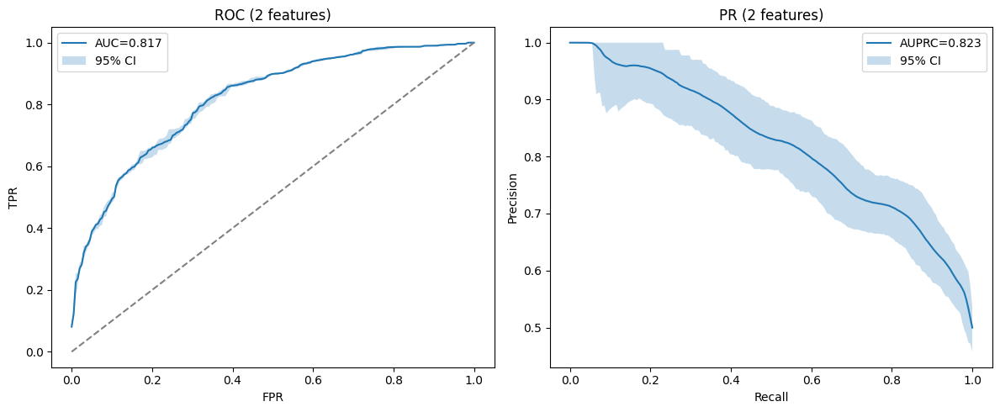

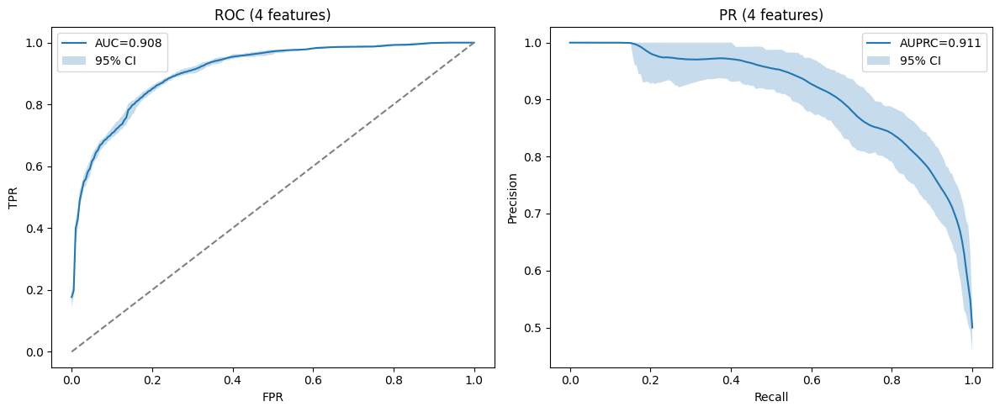

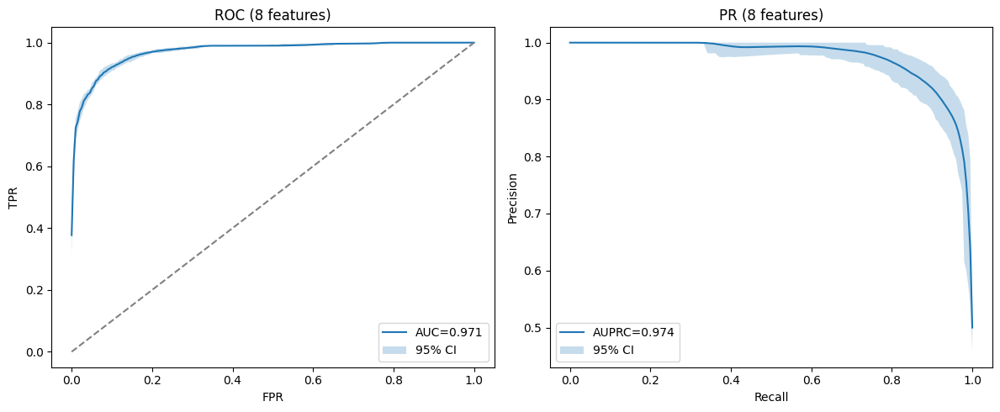

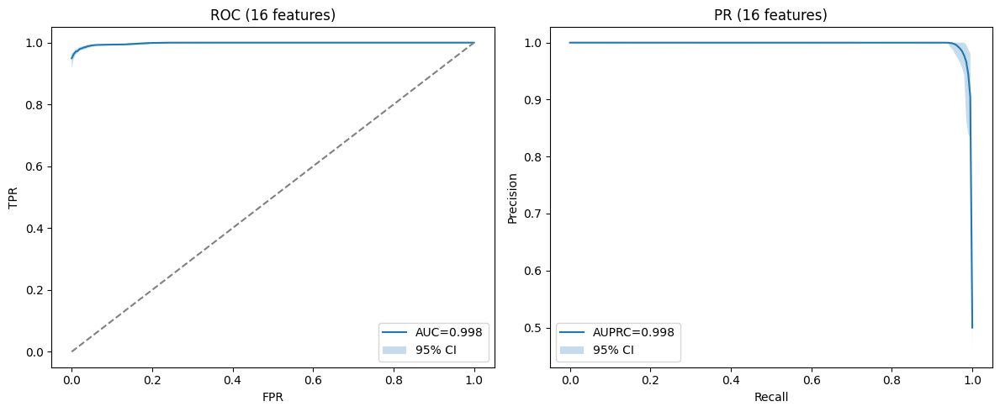

In [ ]:
n_features_list = [2, 4, 8, 16]  
dfm = repeat_df_dict[1] 
df_sub = dfm[dfm['target'].isin(class_pair)].copy()
y_full = (df_sub['target'] == target_positive).astype(int).values

thresholds = np.linspace(0,1,200)
n_bootstrap_local = 500
ci_level = 0.95

for n_feat in n_features_list:
    X_full = df_sub[[f"x{i+1}" for i in range(n_feat)]].values
    X_tr, X_te, y_tr, y_te = train_test_split(X_full, y_full, test_size=0.3, stratify=y_full, random_state=42)

    lda = LinearDiscriminantAnalysis()
    lda.fit(X_tr, y_tr)
    probs_te = lda.predict_proba(X_te)[:,1]

    fpr_g, base_tpr, lower_tpr, upper_tpr, auc_mean, auc_ci = roc_bootstrap_train_on_test(
        LinearDiscriminantAnalysis, X_tr, y_tr, X_te, y_te,
        n_bootstrap=n_bootstrap_local, fpr_grid=thresholds,
        seed=42, alpha=ci_level
    )

    recall_grid = np.linspace(0,1,200)
    y_probs_all = probs_te
    y_true_all = y_te
    precision_list = []
    precision_interp_list = []
    rng = np.random.default_rng(42)

    for i in range(n_bootstrap_local):
        idx = rng.choice(len(y_true_all), len(y_true_all), replace=True)
        y_true_bs = y_true_all[idx]
        y_probs_bs = y_probs_all[idx]
        precision_bs, recall_bs, _ = precision_recall_curve(y_true_bs, y_probs_bs)
        precision_interp = np.interp(recall_grid, recall_bs[::-1], precision_bs[::-1])
        precision_interp_list.append(precision_interp)
        precision_list.append(average_precision_score(y_true_bs, y_probs_bs))

    precision_interp_arr = np.array(precision_interp_list)
    lower_prec, upper_prec = compute_ci(precision_interp_arr, ci_level)
    base_prec = precision_interp_arr.mean(axis=0)
    auprc_mean = np.mean(precision_list)
    auprc_ci = np.percentile(precision_list, [2.5, 97.5])

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))

    ax1.plot(fpr_g, base_tpr, label=f'AUC={auc_mean:.3f}')
    ax1.fill_between(fpr_g, lower_tpr, upper_tpr, alpha=0.25, label='95% CI')
    ax1.plot([0,1],[0,1],'--', color='gray')
    ax1.set_xlabel('FPR'); ax1.set_ylabel('TPR'); ax1.set_title(f'ROC ({n_feat} features)')
    ax1.legend()

    ax2.plot(recall_grid, base_prec, label=f'AUPRC={auprc_mean:.3f}')
    ax2.fill_between(recall_grid, lower_prec, upper_prec, alpha=0.25, label='95% CI')
    ax2.set_xlabel('Recall'); ax2.set_ylabel('Precision'); ax2.set_title(f'PR ({n_feat} features)')
    ax2.legend()

    plt.tight_layout()
    plt.show()


### [10*] Повторить пункты [3]+[5] для алгоритма SVM.

===== mult = 1 =====


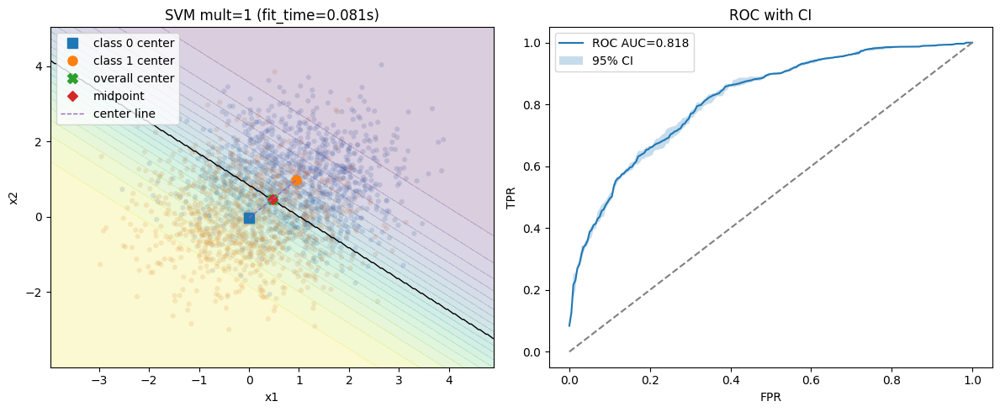

mult=1 | ROC AUC mean 0.8175 CI95 [0.8137, 0.8200]

===== mult = 2 =====


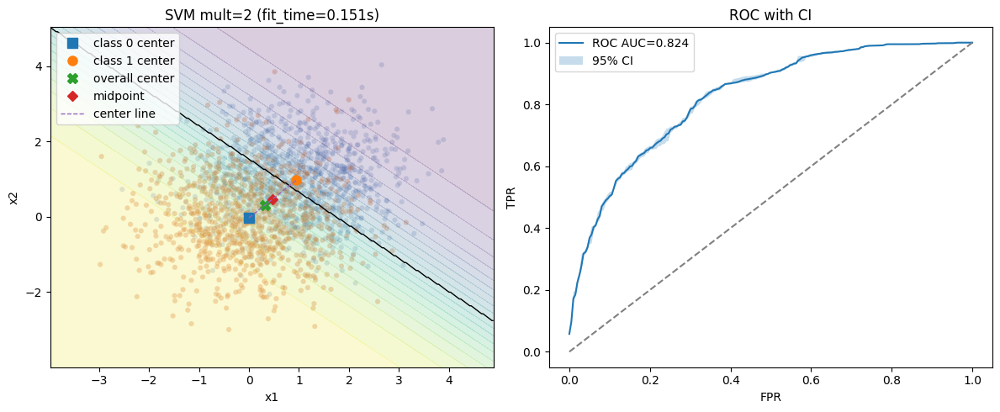

mult=2 | ROC AUC mean 0.8244 CI95 [0.8228, 0.8252]

===== mult = 5 =====


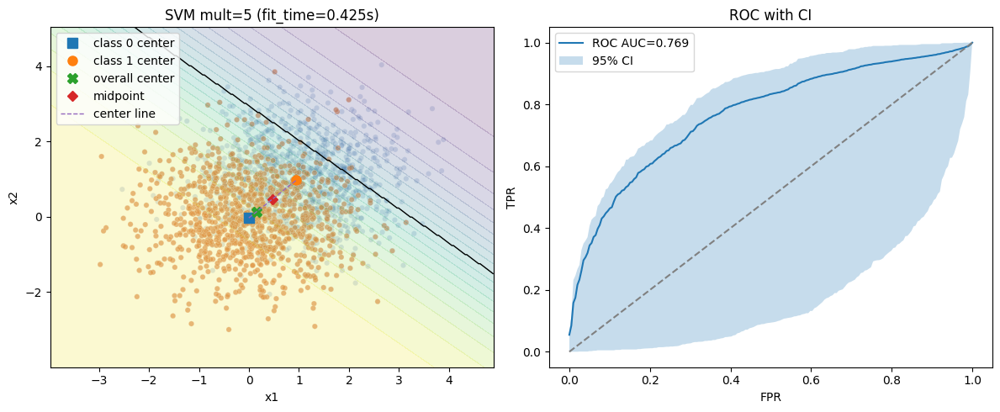

mult=5 | ROC AUC mean 0.7688 CI95 [0.1754, 0.8284]

===== mult = 10 =====


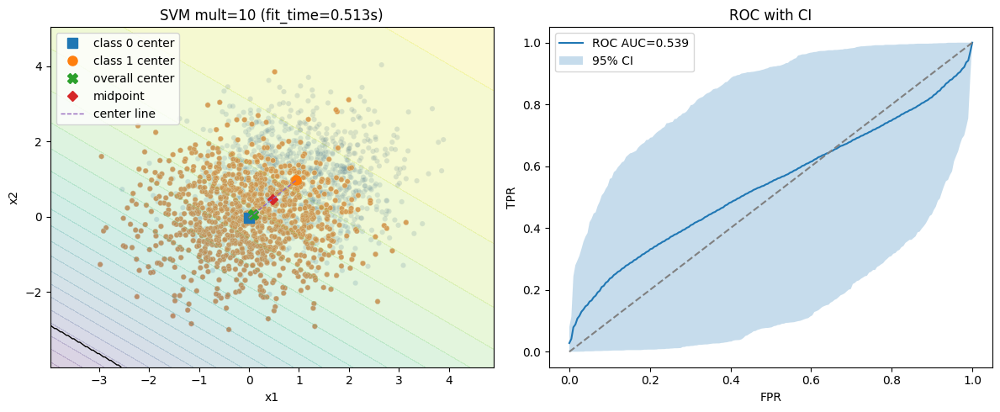

mult=10 | ROC AUC mean 0.5386 CI95 [0.1644, 0.8359]

===== mult = 20 =====


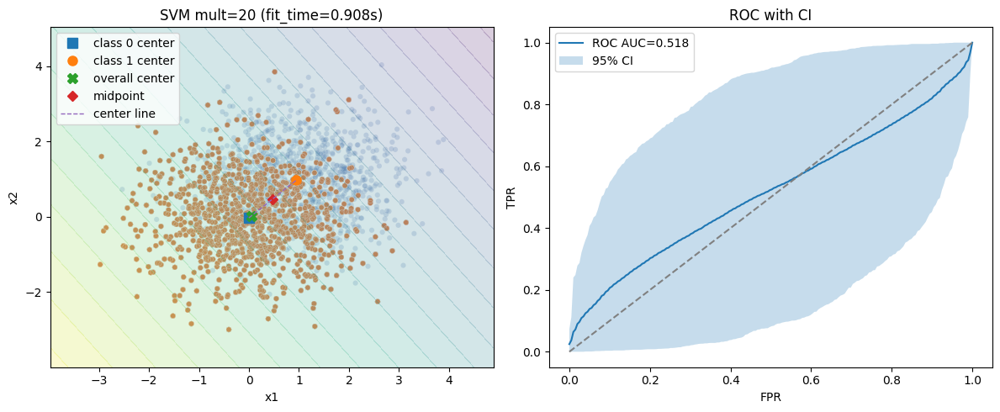

mult=20 | ROC AUC mean 0.5181 CI95 [0.1662, 0.8334]

===== mult = 50 =====


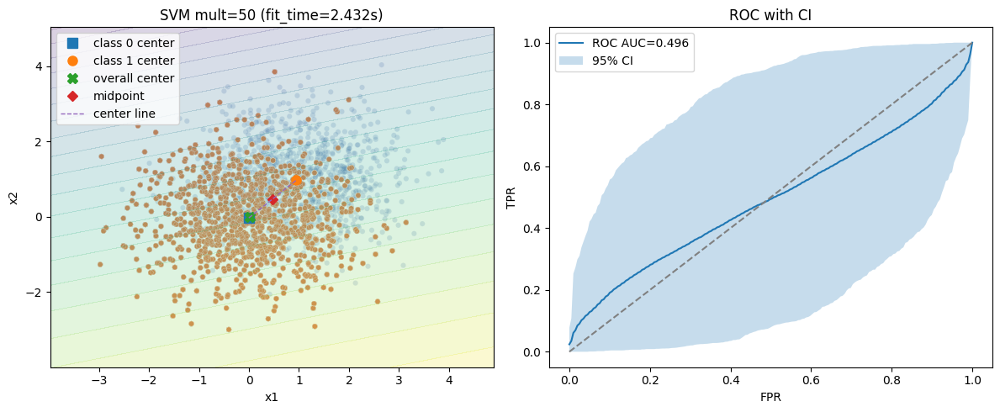

mult=50 | ROC AUC mean 0.4957 CI95 [0.1641, 0.8359]

===== mult = 100 =====


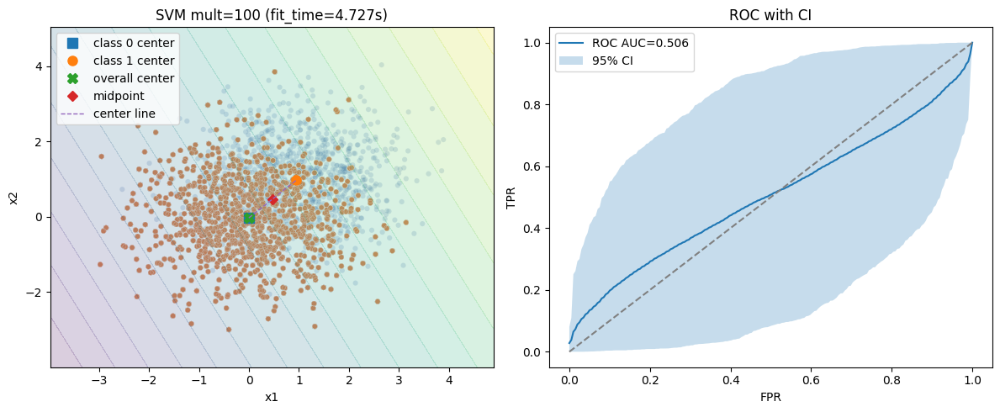

mult=100 | ROC AUC mean 0.5060 CI95 [0.1673, 0.8324]

===== mult = 1000 =====


In [ ]:
multipliers_svm = list(df_multipliers)
n_bootstrap_local = 500
ci_level = 0.95
thresholds = np.linspace(0,1,200)

for m in multipliers_svm:
    print("===== mult =", m, "=====")
    dfm = repeat_df_dict[m]
    df_sub = dfm[dfm['target'].isin(class_pair)].copy()
    
    X_full = df_sub[list(feat_pair)].values
    y_full = (df_sub['target'] == target_positive).astype(int).values

    X_tr, X_te, y_tr, y_te = train_test_split(
        X_full, y_full, test_size=0.3, stratify=y_full, random_state=42
    )

    svm = SVC(kernel='linear', probability=True, random_state=42)
    t0 = time.time()
    svm.fit(X_tr, y_tr)
    t_fit = time.time() - t0
    probs_te = svm.predict_proba(X_te)[:,1]

    fpr_g, base_tpr, lower_tpr, upper_tpr, auc_mean, auc_ci = roc_bootstrap_train_on_test(
        lambda: SVC(kernel='linear', probability=True), X_tr, y_tr, X_te, y_te,
        n_bootstrap=n_bootstrap_local, fpr_grid=thresholds,
        seed=42, alpha=ci_level
    )

    xx_min, xx_max = X_full[:,0].min()-1, X_full[:,0].max()+1
    yy_min, yy_max = X_full[:,1].min()-1, X_full[:,1].max()+1
    xx, yy = np.meshgrid(np.linspace(xx_min, xx_max, 300),
                         np.linspace(yy_min, yy_max, 300))
    grid = np.c_[xx.ravel(), yy.ravel()]
    prob_grid = svm.predict_proba(grid)[:,1].reshape(xx.shape)

    centers = {cls: df_sub[df_sub['target']==cls][list(feat_pair)].mean().values
               for cls in class_pair}
    overall_center = df_sub[list(feat_pair)].mean().values
    midpoint = (centers[class_pair[0]] + centers[class_pair[1]]) / 2

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))

    sns.scatterplot(x=X_full[:,0], y=X_full[:,1], hue=y_full, alpha=0.2, s=20, ax=ax1, palette='deep', legend=False)
    ax1.contourf(xx, yy, prob_grid, levels=20, alpha=0.2)
    ax1.contour(xx, yy, prob_grid, levels=[0.5], colors='k', linewidths=1)
    ax1.plot(*centers[class_pair[0]], 's', markersize=8, label=f'class {class_pair[0]} center')
    ax1.plot(*centers[class_pair[1]], 'o', markersize=8, label=f'class {class_pair[1]} center')
    ax1.plot(*overall_center, 'X', markersize=8, label='overall center')
    ax1.plot(*midpoint, 'D', markersize=6, label='midpoint')
    ax1.plot([centers[class_pair[0]][0], centers[class_pair[1]][0]],
             [centers[class_pair[0]][1], centers[class_pair[1]][1]],
             '--', linewidth=1, label='center line')
    ax1.set_xlabel(feat_pair[0])
    ax1.set_ylabel(feat_pair[1])
    ax1.set_title(f"SVM mult={m} (fit_time={t_fit:.3f}s)")
    ax1.legend(loc='best')

    ax2.plot(fpr_g, base_tpr, label=f'ROC AUC={auc_mean:.3f}')
    ax2.fill_between(fpr_g, lower_tpr, upper_tpr, alpha=0.25, label=f'{int(ci_level*100)}% CI')
    ax2.plot([0,1],[0,1],'--', color='gray')
    ax2.set_xlabel("FPR"); ax2.set_ylabel("TPR"); ax2.set_title("ROC with CI")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    print(f"mult={m} | ROC AUC mean {auc_mean:.4f} CI95 [{auc_ci[0]:.4f}, {auc_ci[1]:.4f}]\n")
